In [137]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [138]:
df= pd.read_excel("C:/Supriyaa-spark-notes/Superstore_Sales.xls")
df.head(5)

,Row ID,Order ID,Order Date,Order Priority,Order Quantity,Sales,Discount,Ship Mode,Profit,Unit Price,...,Customer Name,Province,Region,Customer Segment,Product Category,Product Sub-Category,Product Name,Product Container,Product Base Margin,Ship Date
0,1,3,40464,Low,6,261.54,0.04,Regular Air,-213.25,38.94,...,Muhammed MacIntyre,Nunavut,Nunavut,Small Business,Office Supplies,Storage & Organization,"Eldon Base for stackable storage shelf, platinum",Large Box,0.80,2010-10-20
1,49,293,41183,High,49,10123.02,0.07,Delivery Truck,457.81,208.16,...,Barry French,Nunavut,Nunavut,Consumer,Office Supplies,Appliances,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Jumbo Drum,0.58,2012-10-02
2,50,293,41183,High,27,244.57,0.01,Regular Air,46.71,8.69,...,Barry French,Nunavut,Nunavut,Consumer,Office Supplies,Binders and Binder Accessories,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Small Box,0.39,2012-10-03
3,80,483,40734,High,30,4965.76,0.08,Regular Air,1198.97,195.99,...,Clay Rozendal,Nunavut,Nunavut,Corporate,Technology,Telephones and Communication,R380,Small Box,0.58,2011-07-12
4,85,515,40418,Not Specified,19,394.27,0.08,Regular Air,30.94,21.78,...,Carlos Soltero,Nunavut,Nunavut,Consumer,Office Supplies,Appliances,Holmes HEPA Air Purifier,Medium Box,0.50,2010-08-30


In [139]:
#Convert date columns into pnada datatime
# the column 'Order Date' is having unix  time cast as double which has to be converted to datetime format
import datetime
def unixToDatetime(inp):
    seconds = (inp - 25569) * 86400.0
    return datetime.datetime.utcfromtimestamp(seconds)
df.loc[:,'Order Date'] = df['Order Date'].apply(lambda x : unixToDatetime(x))
df.loc[:,'Ship Date'] = pd.to_datetime(df['Ship Date'], format='%d/%m/%Y') 
print(df[['Order Date','Ship Date']].to_string(index=False))

Order Date  Ship Date
2010-10-13 2010-10-20
2012-10-01 2012-10-02
2012-10-01 2012-10-03
2011-07-10 2011-07-12
2010-08-28 2010-08-30
2010-08-28 2010-08-30
2011-06-17 2011-06-17
2011-06-17 2011-06-18
2011-03-24 2011-03-25
2010-02-26 2010-02-26
2010-11-23 2010-11-24
2010-11-23 2010-11-24
2012-06-08 2012-06-09
2012-06-08 2012-06-10
2012-08-04 2012-08-04
2011-05-30 2011-05-31
2009-11-25 2009-11-26
2012-02-14 2012-02-16
2012-02-14 2012-02-16
2012-04-15 2012-04-22
2012-04-15 2012-04-19
2010-03-12 2010-03-14
2010-03-12 2010-03-14
2011-03-09 2011-03-11
2011-03-09 2011-03-14
2012-08-04 2012-08-06
2011-05-06 2011-05-07
2010-12-23 2010-12-25
2010-11-08 2010-11-13
2012-10-21 2012-10-22
2011-01-01 2011-01-02
2011-01-01 2011-01-03
2011-10-10 2011-10-11
2011-10-10 2011-10-11
2010-09-23 2010-09-25
2011-07-19 2011-07-19
2009-10-09 2009-10-09
2009-10-09 2009-10-11
2009-10-09 2009-10-10
2010-12-09 2010-12-11
2012-10-08 2012-10-10
2012-05-02 2012-05-03
2010-03-08 2010-03-08
2011-05-28 2011-05-30
2010-09-19

In [140]:
#Add month, day and year columns
df['Order Month']=df['Order Date'].dt.month
df['Order Year']=df['Order Date'].dt.year
df['Order Day']=df['Order Date'].dt.day
df[['Order Date','Order Month','Order Year','Order Day']]

,Order Date,Order Month,Order Year,Order Day
0,2010-10-13,10,2010,13
1,2012-10-01,10,2012,1
2,2012-10-01,10,2012,1
3,2011-07-10,7,2011,10
4,2010-08-28,8,2010,28
...,...,...,...,...
8394,2010-08-09,8,2010,9
8395,2010-08-09,8,2010,9
8396,2011-04-08,4,2011,8
8397,2011-04-08,4,2011,8


In [141]:
df.shape

(8399, 24)

In [142]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Order Priority', 'Order Quantity',
       'Sales', 'Discount', 'Ship Mode', 'Profit', 'Unit Price',
       'Shipping Cost', 'Customer Name', 'Province', 'Region',
       'Customer Segment', 'Product Category', 'Product Sub-Category',
       'Product Name', 'Product Container', 'Product Base Margin', 'Ship Date',
       'Order Month', 'Order Year', 'Order Day'],
      dtype='object')

In [143]:
''' we can observe all cols having 8399 non-null values whereas product base margin is having 8336 non null values 
so there are 8399-8336=63 missing values
'''
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8399 entries, 0 to 8398
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Row ID                8399 non-null   int64         
 1   Order ID              8399 non-null   int64         
 2   Order Date            8399 non-null   datetime64[ns]
 3   Order Priority        8399 non-null   object        
 4   Order Quantity        8399 non-null   int64         
 5   Sales                 8399 non-null   float64       
 6   Discount              8399 non-null   float64       
 7   Ship Mode             8399 non-null   object        
 8   Profit                8399 non-null   float64       
 9   Unit Price            8399 non-null   float64       
 10  Shipping Cost         8399 non-null   float64       
 11  Customer Name         8399 non-null   object        
 12  Province              8399 non-null   object        
 13  Region            

In [144]:
df.describe()

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day
count,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8336.00,8399.00,8399.00,8399.00
mean,4200.00,29965.18,25.57,1775.88,0.05,181.18,89.35,12.84,0.51,6.52,2010.48,15.53
std,2424.73,17260.88,14.48,3585.05,0.03,1196.65,290.35,17.26,0.14,3.45,1.12,8.78
min,1.00,3.00,1.00,2.24,0.00,-14140.70,0.99,0.49,0.35,1.00,2009.00,1.00
25%,2100.50,15011.50,13.00,143.19,0.02,-83.31,6.48,3.30,0.38,4.00,2009.00,8.00
50%,4200.00,29857.00,26.00,449.42,0.05,-1.50,20.99,6.07,0.52,7.00,2010.00,15.00
75%,6299.50,44596.00,38.00,1709.32,0.08,162.75,85.99,13.99,0.59,9.00,2012.00,23.00
max,8399.00,59973.00,50.00,89061.05,0.25,27220.69,6783.02,164.73,0.85,12.00,2012.00,31.00


In [145]:
df.isna().sum()

Row ID                   0
Order ID                 0
Order Date               0
Order Priority           0
Order Quantity           0
Sales                    0
Discount                 0
Ship Mode                0
Profit                   0
Unit Price               0
Shipping Cost            0
Customer Name            0
Province                 0
Region                   0
Customer Segment         0
Product Category         0
Product Sub-Category     0
Product Name             0
Product Container        0
Product Base Margin     63
Ship Date                0
Order Month              0
Order Year               0
Order Day                0
dtype: int64

In [146]:
# we shall fill the missing values with mean value of the column
df['Product Base Margin'].fillna(df['Product Base Margin'].mean(),inplace=True)

In [147]:
df.isna().sum()

Row ID                  0
Order ID                0
Order Date              0
Order Priority          0
Order Quantity          0
Sales                   0
Discount                0
Ship Mode               0
Profit                  0
Unit Price              0
Shipping Cost           0
Customer Name           0
Province                0
Region                  0
Customer Segment        0
Product Category        0
Product Sub-Category    0
Product Name            0
Product Container       0
Product Base Margin     0
Ship Date               0
Order Month             0
Order Year              0
Order Day               0
dtype: int64

In [148]:
df.describe()

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day
count,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00,8399.00
mean,4200.00,29965.18,25.57,1775.88,0.05,181.18,89.35,12.84,0.51,6.52,2010.48,15.53
std,2424.73,17260.88,14.48,3585.05,0.03,1196.65,290.35,17.26,0.14,3.45,1.12,8.78
min,1.00,3.00,1.00,2.24,0.00,-14140.70,0.99,0.49,0.35,1.00,2009.00,1.00
25%,2100.50,15011.50,13.00,143.19,0.02,-83.31,6.48,3.30,0.38,4.00,2009.00,8.00
50%,4200.00,29857.00,26.00,449.42,0.05,-1.50,20.99,6.07,0.52,7.00,2010.00,15.00
75%,6299.50,44596.00,38.00,1709.32,0.08,162.75,85.99,13.99,0.59,9.00,2012.00,23.00
max,8399.00,59973.00,50.00,89061.05,0.25,27220.69,6783.02,164.73,0.85,12.00,2012.00,31.00


In [149]:
df.nunique()

Row ID                  8399
Order ID                5496
Order Date              1418
Order Priority             5
Order Quantity            50
Sales                   8153
Discount                  16
Ship Mode                  3
Profit                  7986
Unit Price               751
Shipping Cost            652
Customer Name            795
Province                  13
Region                     8
Customer Segment           4
Product Category           3
Product Sub-Category      17
Product Name            1263
Product Container          7
Product Base Margin       52
Ship Date               1450
Order Month               12
Order Year                 4
Order Day                 31
dtype: int64

In [150]:
df.duplicated().sum()

0

In [151]:
df['Order Priority'].value_counts()

High             1768
Low              1720
Not Specified    1672
Medium           1631
Critical         1608
Name: Order Priority, dtype: int64

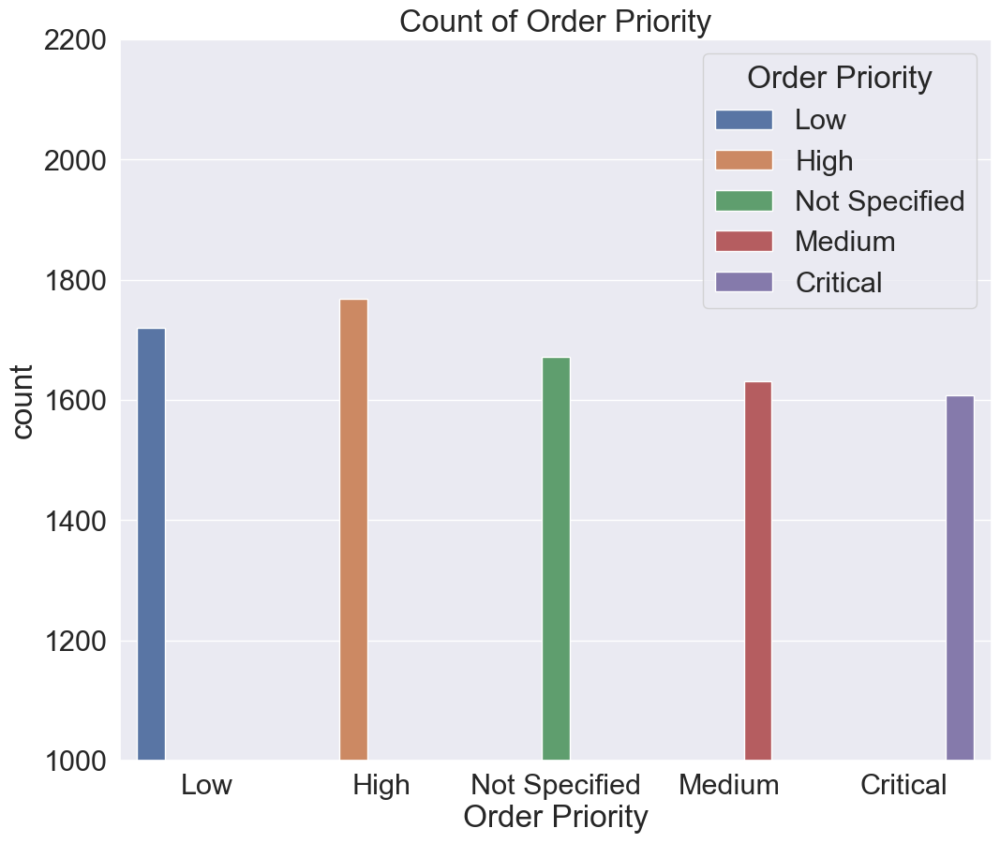

In [152]:
fig=plt.figure(figsize=(12,10))
ax = fig.add_subplot(111)
plt.title('Count of Order Priority')
plt.xlabel('Order Priority')
plt.ylabel('Count')
sns.set_style("darkgrid")
plot = sns.countplot(x=df['Order Priority'],data=df,order =['Low','High','Not Specified','Medium','Critical'], hue = df['Order Priority'])
plot.set_ylim([1000,2200])
plot.set_yticks([1000,1200,1400,1600,1800,2000,2200])
plt.legend(title='Order Priority', loc='best')
plt.show()

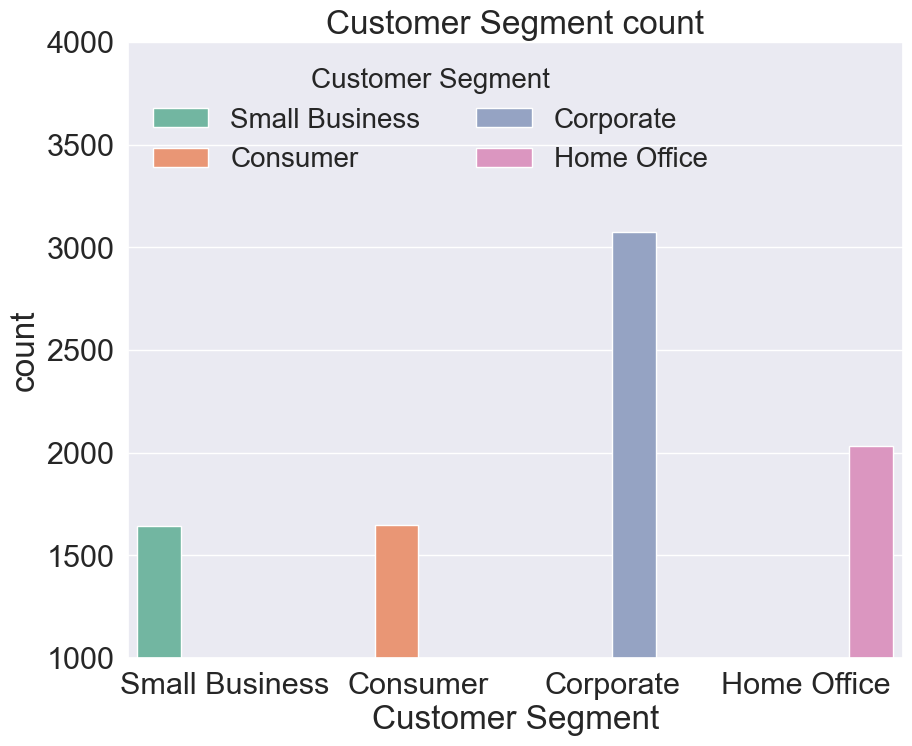

In [153]:
fig=plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
plt.title('Customer Segment count')
plt.xlabel('Customer Segment')
plt.ylabel('Count')
sns.set_style("whitegrid")
plot = sns.countplot(x=df['Customer Segment'],data=df,palette='Set2',order =df['Customer Segment'].unique(), 
                     hue = df['Customer Segment'],width=0.9)
plot.set_ylim([1000,4000])
plot.set_yticks([1000,1500,2000,2500,3000,3500,4000])
plt.legend(title='Customer Segment', loc='upper left',frameon=False,fontsize='small',title_fontsize='small',ncol=2)
plt.show()

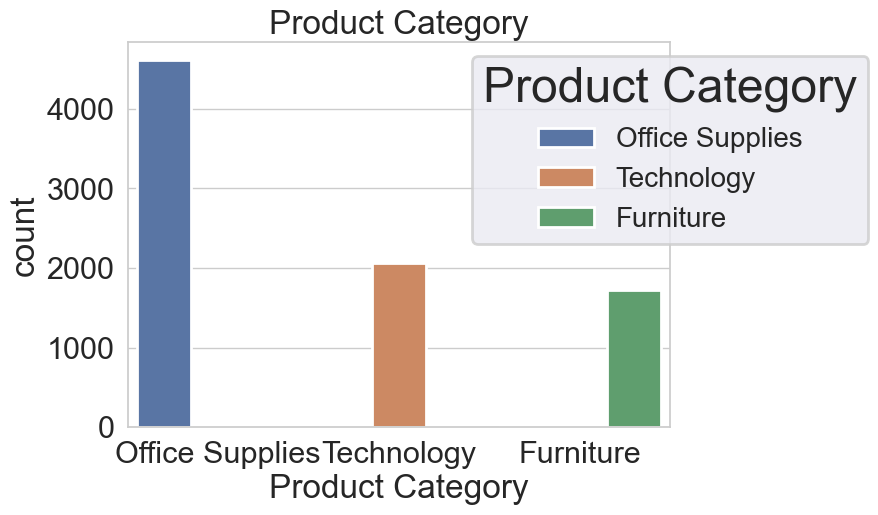

In [154]:
fig=plt.figure(figsize=(7,5))
ax = fig.add_subplot(111)
#ax.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=2.0)
plt.title('Product Category')
plt.xlabel('Product Category')
plt.ylabel('Count')
sns.set_context("poster")
sns.set_style("darkgrid",{'grid.linestyle': '--','grid.linewidth':1.0})
plot = sns.countplot(x=df['Product Category'],data=df,order =df['Product Category'].unique(), 
                     hue = df['Product Category'],width=0.9)
plt.legend(title='Product Category', loc='upper center',bbox_to_anchor=(1,1),fontsize='small',title_fontsize='x-large')
plt.show()
#plt.savefig('myplot.png', dpi=300, bbox_inches='tight')

In [155]:
l = list(df['Order Month'].unique())
l.sort()
d=df.groupby('Order Month')
print(d)
def profit(col): 
  return col[col > 0].sum()
  
def loss(col): 
  return col[col < 0].sum()

df1=pd.DataFrame(d['Profit'].agg([('total_profit', profit),('total_loss', loss)]))
df1['order_month']= l
df1['total_loss_pos']=df1['total_loss'].apply(lambda x : round(abs(x),2))
df1['total_loss']=df1['total_loss'].apply(lambda x: round(x,2))
df1['total_profit']=df1['total_profit'].apply(lambda x: round(x,2))
df1

,total_profit,total_loss,order_month,total_loss_pos
Order Month,,,,
1,265854.49,-94333.75,1,94333.75
2,198380.68,-95951.51,2,95951.51
3,226930.87,-122131.54,3,122131.54
4,222757.38,-98850.90,4,98850.90
5,187622.04,-71993.32,5,71993.32
6,176866.99,-58163.39,6,58163.39
7,225891.49,-104926.19,7,104926.19
8,157535.90,-82950.42,8,82950.42
9,250673.48,-86320.79,9,86320.79


In [156]:
df1.describe()

,total_profit,total_loss,order_month,total_loss_pos
count,12.00,12.00,12.00,12.00
mean,218689.22,-91875.22,6.50,91875.22
std,34571.04,16416.85,3.61,16416.85
min,157535.90,-122131.54,1.00,58163.39
25%,195691.02,-99915.02,3.75,85478.20
50%,224324.43,-95142.63,6.50,95142.63
75%,248141.29,-85478.20,9.25,99915.02
max,265854.49,-58163.39,12.00,122131.54


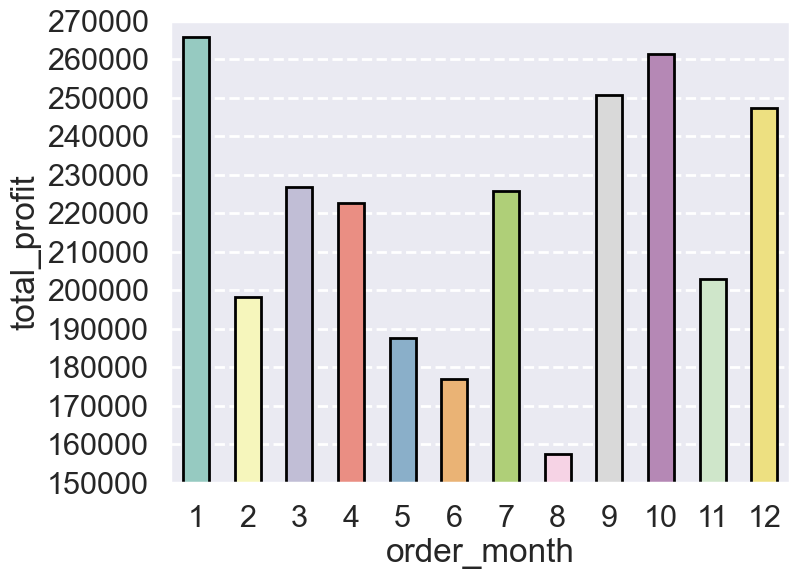

In [157]:
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plot = sns.barplot(x=df1['order_month'],y=df1['total_profit'],data=df1,width=0.5,palette='Set3',edgecolor='black')
plot.set_ylim([150000,270000])
plot.set_yticks([150000,160000,170000,180000,190000,200000,210000,220000,230000,240000,250000,260000,270000])
plt.show()                        

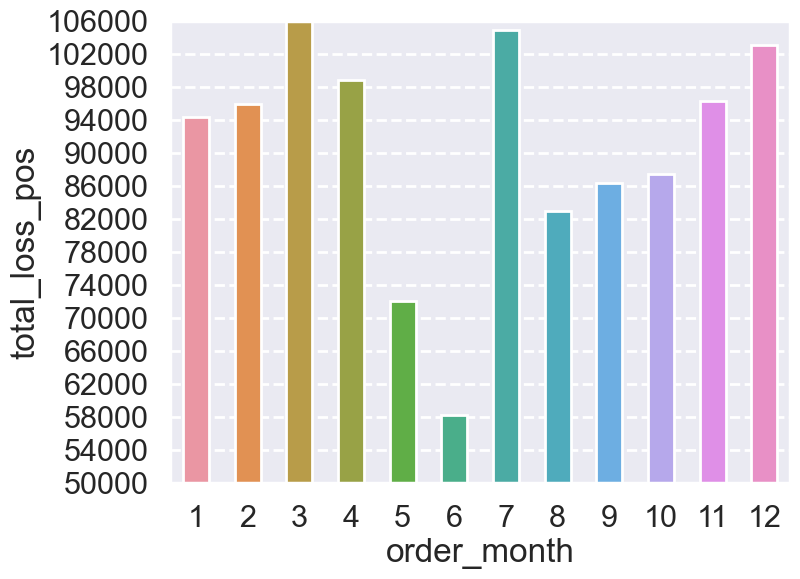

In [158]:
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plot = sns.barplot(x=df1['order_month'],y=df1['total_loss_pos'],data=df1,width=0.5)
plot.set_ylim([50000,106000])
plot.set_yticks([50000,54000,58000,62000,66000,70000,74000,78000,82000,86000,90000,94000,98000,102000,106000])
plt.show()  

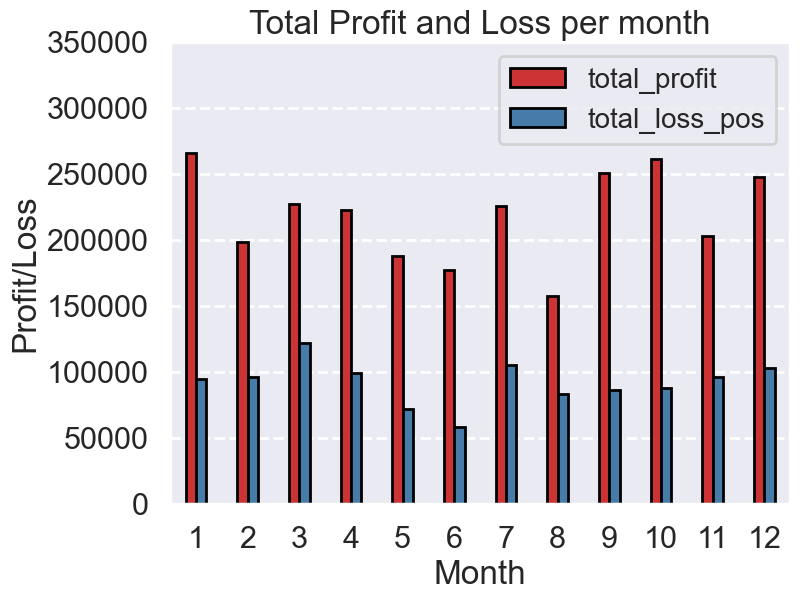

In [159]:
# Reshape the data into a long format using melt
df2 = pd.melt(df1, id_vars=['order_month'], value_vars=['total_profit', 'total_loss_pos'],
              var_name='category', value_name='amount')

# Create the barplot using the melted DataFrame
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plt.title('Total Profit and Loss per month')
plot = sns.barplot(x='order_month', y='amount', hue='category', data=df2,width=0.4,edgecolor='black',palette='Set1')
plot.set_ylim([0,350000])
plot.set(ylabel='Profit/Loss',xlabel='Month')
plot.legend(loc='best',fontsize='small')
plt.show()

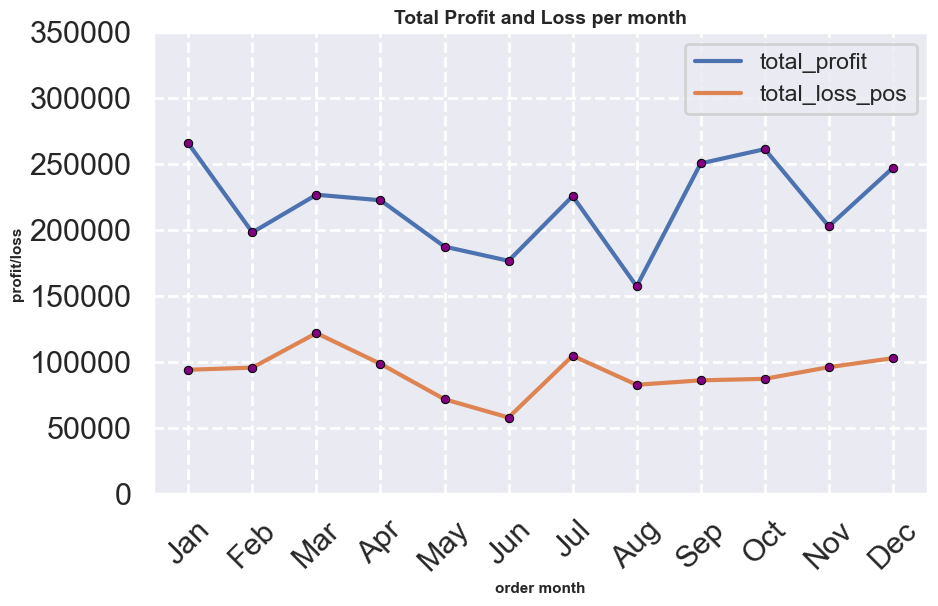

In [160]:
def num_to_str(inp):
    d={1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}
    if inp>=1 and inp<=12:
        return d[inp]
    else:
        return "not a month"
df2['order_month_str']=df2['order_month'].apply(lambda x: num_to_str(x))
fig=plt.figure(figsize=(10,6))
ax=fig.add_subplot(111)
plt.title('Total Profit and Loss per month',fontsize=14,fontweight='bold')
sns.set_style('darkgrid')
plot = sns.lineplot(x='order_month_str', y='amount', hue='category', data=df2,
                    marker='o',markerfacecolor='purple',markeredgecolor='black',markersize=6)
plot.set_xlabel('order month', fontdict={'weight': 'bold','size':11})
plot.set_ylabel('profit/loss', fontdict={'weight': 'bold','size':11})
ax.tick_params(axis='x', labelrotation=45)
plot.set_ylim([0,350000])
plot.legend(loc='best',fontsize='x-small')
plt.show()

In [161]:
#Skewed and normal distribution of data
df1.skew().sort_values(ascending=False)

total_loss        0.38
order_month       0.00
total_profit     -0.27
total_loss_pos   -0.38
dtype: float64

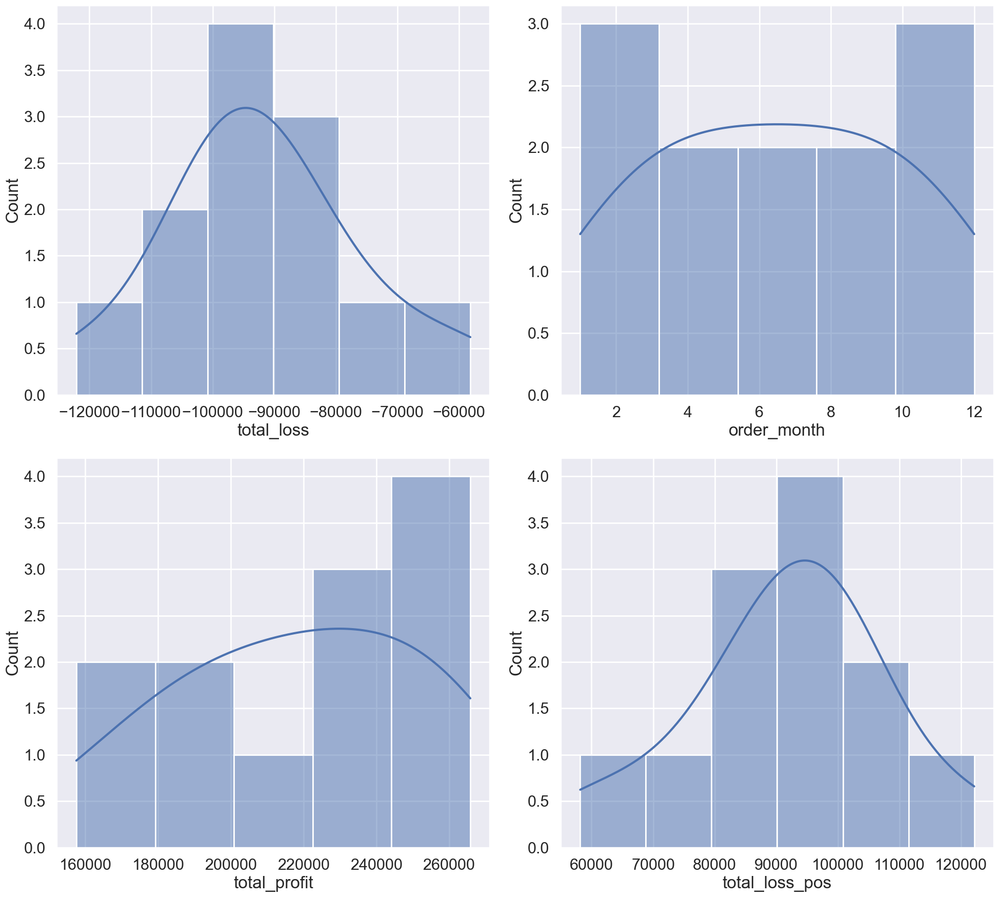

In [162]:
fig, axs = plt.subplots(2,2,figsize=(20,18))
plot1=sns.histplot(data =df1['total_loss'], kde = True,ax=axs[0,0])
plot2=sns.histplot(data =df1['order_month'], kde = True,ax=axs[0,1])
plot3=sns.histplot(data =df1['total_profit'], kde = True,ax=axs[1,0])
plot4=sns.histplot(data =df1['total_loss_pos'], kde = True,ax=axs[1,1])
fig.tight_layout() 
#plot5=sns.histplot(data =df1['total_loss_pos_map'], kde = True,ax=axs[1,1])
#plot6=sns.histplot(data =df1['total_loss_pos_med'], kde = True,ax=axs[1,2])

In [163]:
# IQR method to find outlier
# Mostly used on skewed distributions
Q1 = np.percentile(df1['total_loss_pos'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df1['total_loss_pos'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
print(Q3)
print(Q1)
print(IQR)
#print((df1['total_loss_pos'] < (Q1 - 1.5 * IQR)) | (df1['total_loss_pos'] > (Q3 + 1.5 * IQR)))
outliers=[]
for i in df1['total_loss_pos'] : 
        if (i<(Q1 - 1.5 * IQR) or i>(Q3 + 1.5 * IQR)):
            outliers.append(i)
print(outliers)

100979.15
84635.605
16343.544999999998
[58163.39]


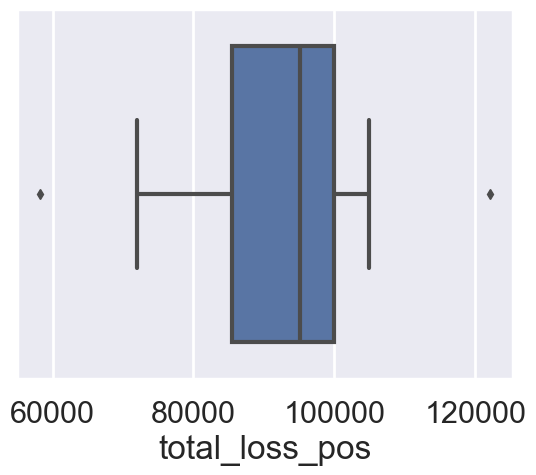

In [164]:
#Boxplot to find outlier
plot = sns.boxplot(x=df1['total_loss_pos'],data=df1)
plt.show()

In [165]:
# Z-score method to find outlier by setting threshold
# Mostly used on normal distributions
outliers = []
threshold = 2
mean = np.mean(df1['total_loss_pos'])
std = df1['total_loss_pos'].std()
print(mean, std)
for i in df1['total_loss_pos']:
    z_score = (i-mean)/std
    if (np.abs(z_score) > threshold):
        outliers.append(i)
print(outliers)

91875.22333333333 16416.848049742475
[58163.39]


In [166]:
#Handling outliers approach1
#Mapping the outliers > 75Th percentile to P90 and < 25Th percentile to P10
P10 = np.percentile(df1['total_loss_pos'], 75)
P90 = np.percentile(df1['total_loss_pos'], 25)
print(P10,P90)
def mapvalue(inp,P10,P90):
    if inp<P10:
        return P10
    elif inp>P90:
        return P90
    else:
        return inp
df1['total_loss_pos_map'] =df1['total_loss_pos'].apply(lambda x:mapvalue(x,P10,P90) )

99915.025 85478.1975


In [167]:
# mapping z-score value
df1["total_loss_pos_map"] = np.where(df1["total_loss_pos"] <60000, 60000,df1['total_loss_pos']) #mapping using np.where()
df1["total_loss_pos_map"] = np.where(df1["total_loss_pos"] >120000, 120000,df1['total_loss_pos'])

In [168]:
#Handling outliers approach2
#Removing the outlier
df2 = df1[~((df1['total_loss_pos'] < (Q1 - 1.5 * IQR)) |(df1['total_loss_pos'] > (Q3 + 1.5 * IQR)))]
df3 = df1[~((df1['total_loss_pos']) == 58163.39) ] #z-score
print(df2.shape)

(11, 5)


In [169]:
#Handling outliers approach3
#mapping to some value i.e., mode or median
'''do not map with mean as they are affected by outliers i.e.,
If the outliers with extremely large values are removed then the value of mean will decrease.
If the outliers with extremely small values are removed then the value of mean will increase.
'''
m = df1['total_loss_pos'].median()
#m=87464.90
Q1 = np.percentile(df1['total_loss_pos'], 10)
Q3 = np.percentile(df1['total_loss_pos'], 90)
print(Q1,Q3)
print(m)
def mapvalue(inp,m,Q1,Q3):
    if inp<Q1:
        return m
    elif inp>Q3:
        return m
    else:
        return inp
df1['total_loss_pos_med'] =df1['total_loss_pos'].apply(lambda x:mapvalue(x,m,Q1,Q3) )
df1

73089.03000000001 104744.311
95142.63


,total_profit,total_loss,order_month,total_loss_pos,total_loss_pos_map,total_loss_pos_med
Order Month,,,,,,
1,265854.49,-94333.75,1,94333.75,94333.75,94333.75
2,198380.68,-95951.51,2,95951.51,95951.51,95951.51
3,226930.87,-122131.54,3,122131.54,120000.00,95142.63
4,222757.38,-98850.90,4,98850.90,98850.90,98850.90
5,187622.04,-71993.32,5,71993.32,71993.32,95142.63
6,176866.99,-58163.39,6,58163.39,58163.39,95142.63
7,225891.49,-104926.19,7,104926.19,104926.19,95142.63
8,157535.90,-82950.42,8,82950.42,82950.42,82950.42
9,250673.48,-86320.79,9,86320.79,86320.79,86320.79


In [170]:
df2

,total_profit,total_loss,order_month,total_loss_pos,total_loss_pos_map
Order Month,,,,,
1,265854.49,-94333.75,1,94333.75,94333.75
2,198380.68,-95951.51,2,95951.51,95951.51
3,226930.87,-122131.54,3,122131.54,120000.00
4,222757.38,-98850.90,4,98850.90,98850.90
5,187622.04,-71993.32,5,71993.32,71993.32
7,225891.49,-104926.19,7,104926.19,104926.19
8,157535.90,-82950.42,8,82950.42,82950.42
9,250673.48,-86320.79,9,86320.79,86320.79
10,261481.24,-87464.90,10,87464.90,87464.90


In [171]:
df3

,total_profit,total_loss,order_month,total_loss_pos,total_loss_pos_map
Order Month,,,,,
1,265854.49,-94333.75,1,94333.75,94333.75
2,198380.68,-95951.51,2,95951.51,95951.51
3,226930.87,-122131.54,3,122131.54,120000.00
4,222757.38,-98850.90,4,98850.90,98850.90
5,187622.04,-71993.32,5,71993.32,71993.32
7,225891.49,-104926.19,7,104926.19,104926.19
8,157535.90,-82950.42,8,82950.42,82950.42
9,250673.48,-86320.79,9,86320.79,86320.79
10,261481.24,-87464.90,10,87464.90,87464.90


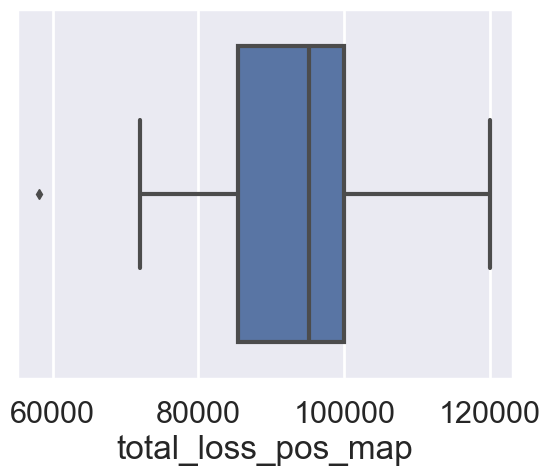

In [172]:
plot = sns.boxplot(x=df1['total_loss_pos_map'],data=df1)
plt.show()

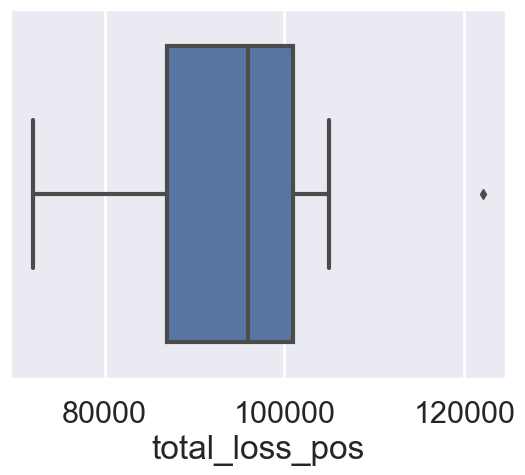

In [173]:
plot = sns.boxplot(x=df2['total_loss_pos'],data=df1)
plt.show()

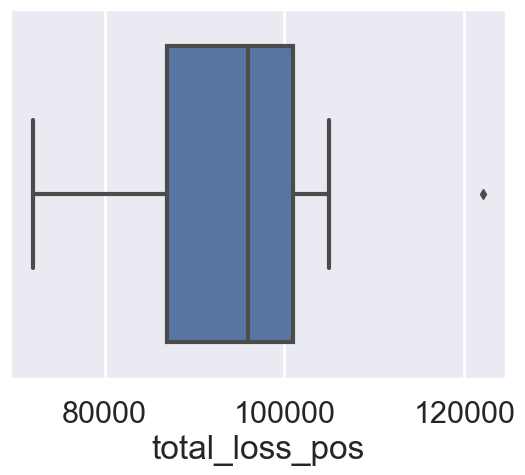

In [174]:
plot = sns.boxplot(x=df3['total_loss_pos'],data=df1)
plt.show()

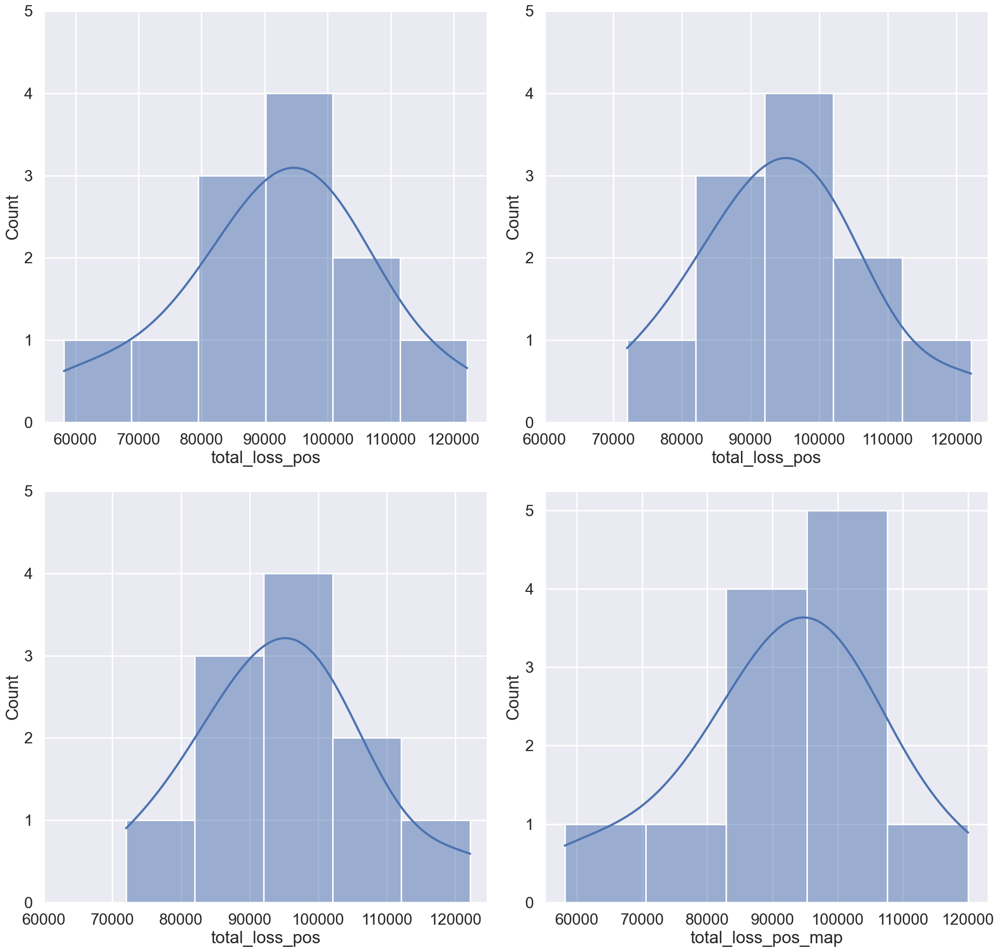

In [175]:
fig, axs = plt.subplots(nrows=2,ncols=2,figsize=(20,19))
plot1=sns.histplot(data =df1['total_loss_pos'], kde = True,ax=axs[0][0])
plot1.set_yticks([0,1,2,3,4,5])
plot1.set_xticks([60000,70000,80000,90000,100000,110000,120000])
plot2=sns.histplot(data =df2['total_loss_pos'], kde = True,ax=axs[0][1])
plot2.set_yticks([0,1,2,3,4,5])
plot2.set_xticks([60000,70000,80000,90000,100000,110000,120000])
plot3=sns.histplot(data =df3['total_loss_pos'], kde = True,ax=axs[1][0])
plot3.set_xticks([60000,70000,80000,90000,100000,110000,120000])
plot3.set_yticks([0,1,2,3,4,5])
plot4=sns.histplot(data =df1['total_loss_pos_map'], kde = True,ax=axs[1][1])
plot4.set_xticks([60000,70000,80000,90000,100000,110000,120000])
plot4.set_yticks([0,1,2,3,4,5])
fig.tight_layout()

In [176]:
df.skew().sort_values(ascending=False)

C:\Users\supri\AppData\Local\Temp\ipykernel_14288\4024944668.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew().sort_values(ascending=False)


Unit Price            14.13
Sales                  5.39
Profit                 3.65
Shipping Cost          2.55
Product Base Margin    0.56
Discount               0.07
Order Day              0.04
Order Year             0.03
Order ID               0.00
Row ID                 0.00
Order Month           -0.01
Order Quantity        -0.02
dtype: float64

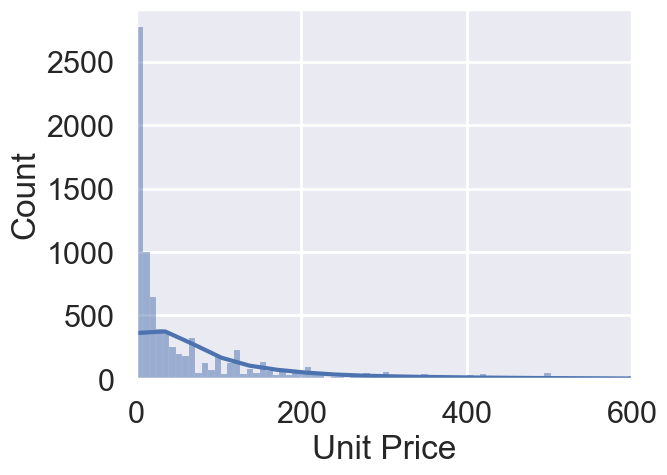

In [177]:
plot1=sns.histplot(data =df['Unit Price'], kde = True)
plot1.set_xlim([0,600])
plt.show()

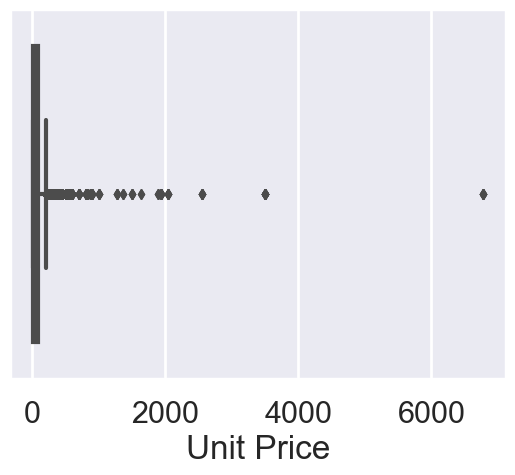

In [178]:
#Univariate outliers
plot = sns.boxplot(x=df['Unit Price'],data=df)
plt.show()

In [179]:
Q1 = np.percentile(df['Unit Price'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df['Unit Price'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
print(Q3)
print(Q1)
print(IQR)
#print((df1['total_loss_pos'] < (Q1 - 1.5 * IQR)) | (df1['total_loss_pos'] > (Q3 + 1.5 * IQR)))
outliers=[]
for i in df['Unit Price'] : 
        if (i<(Q1 - 1.5 * IQR) or i>(Q3 + 1.5 * IQR)):
            outliers.append(i)
print(len(outliers))

85.99
6.48
79.50999999999999
848


In [180]:
P10 = np.percentile(df['Unit Price'], 25)
P90 = np.percentile(df['Unit Price'], 75)
print(P10,P90)
def mapvalue(inp,P10,P90):
    if inp<P10:
        return P10
    elif inp>P90:
        return P90
    else:
        return inp
df['Unit_Price1'] =df['Unit Price'].apply(lambda x:mapvalue(x,P10,P90) )

6.48 85.99


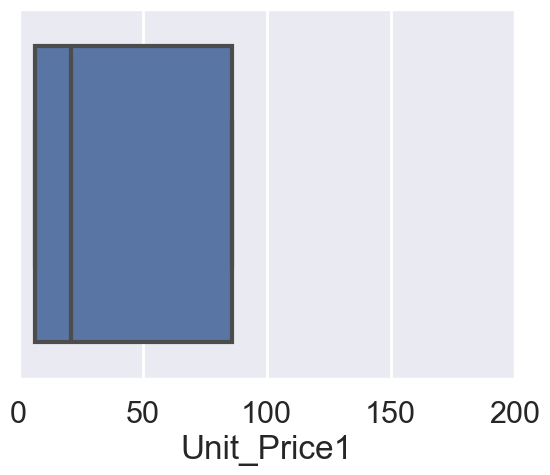

In [181]:
plot = sns.boxplot(x=df['Unit_Price1'],data=df)
plot.set_xlim(0,200)
plt.show()

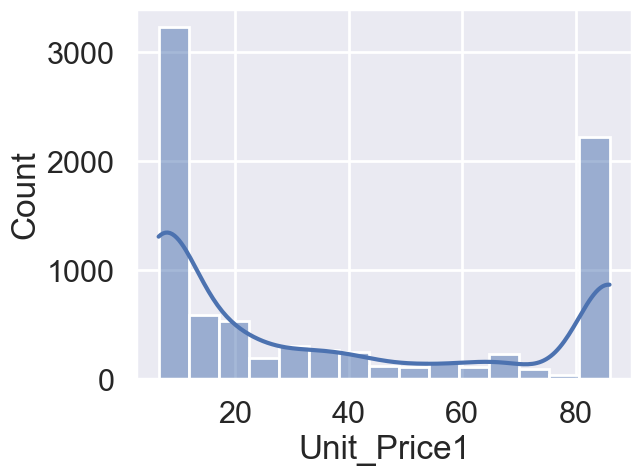

In [182]:
plot1=sns.histplot(data =df['Unit_Price1'], kde = True)
plt.show()

In [183]:
df.skew().sort_values(ascending=False)

C:\Users\supri\AppData\Local\Temp\ipykernel_14288\4024944668.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew().sort_values(ascending=False)


Unit Price            14.13
Sales                  5.39
Profit                 3.65
Shipping Cost          2.55
Product Base Margin    0.56
Unit_Price1            0.53
Discount               0.07
Order Day              0.04
Order Year             0.03
Order ID               0.00
Row ID                 0.00
Order Month           -0.01
Order Quantity        -0.02
dtype: float64

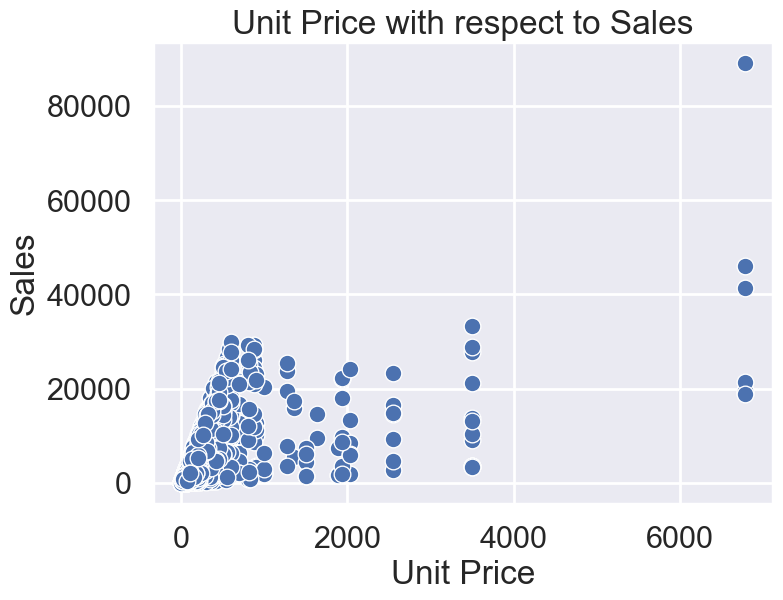

In [184]:
#Scatterplot to check outliers of Unit Price with respect to Sales column
#Multivariate outliers
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plt.xlabel("Unit Price")
plt.ylabel("Sales")
plt.title("Unit Price with respect to Sales")
plot1=sns.scatterplot(x=df['Unit Price'],y=df['Sales'],data=df)
plt.show()

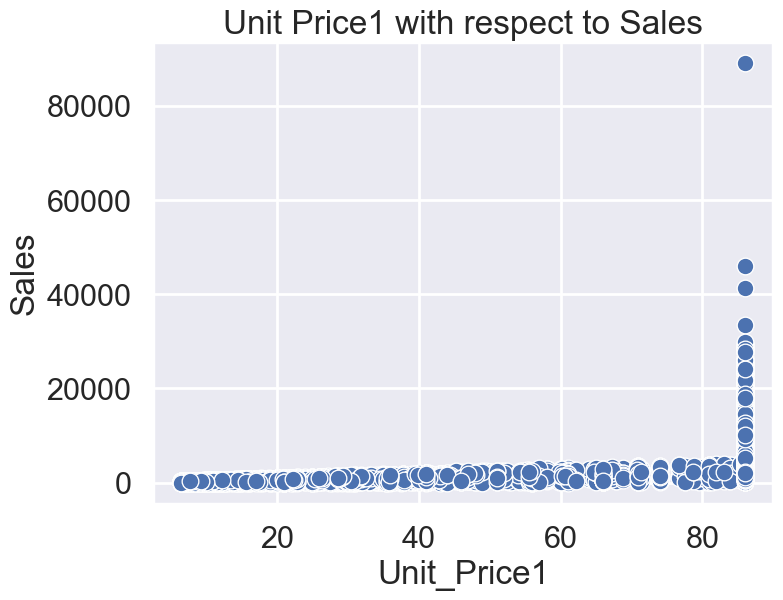

In [185]:
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plt.xlabel("Unit_Price1")
plt.ylabel("Sales")
plt.title("Unit Price1 with respect to Sales")
plot1=sns.scatterplot(x=df['Unit_Price1'],y=df['Sales'],data=df)
plt.show()

In [186]:
#Mapping with mean
m = df['Unit Price'].median()
Q1 = np.percentile(df['Unit Price'], 25)
Q3 = np.percentile(df['Unit Price'], 75)
print(Q1,Q3)
print(m)
def mapvalue(inp,m,Q1,Q3):
    if inp<Q1:
        return m
    elif inp>Q3:
        return m
    else:
        return inp
df['Unit_Price2'] =df['Unit Price'].apply(lambda x:mapvalue(x,m,Q1,Q3) )

6.48 85.99
20.99


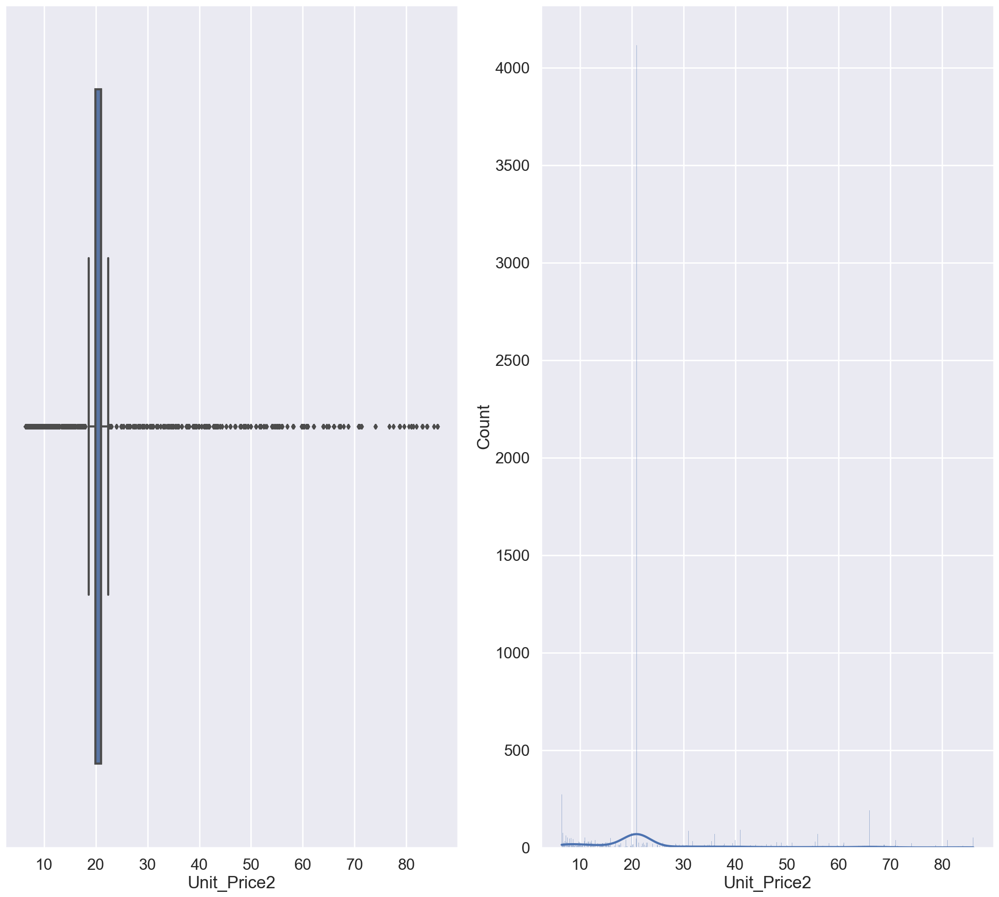

In [187]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,18))
plot = sns.boxplot(x=df['Unit_Price2'],data=df,ax=axs[0])
plot1=sns.histplot(data =df['Unit_Price2'], kde = True,ax=axs[1])
fig.tight_layout()

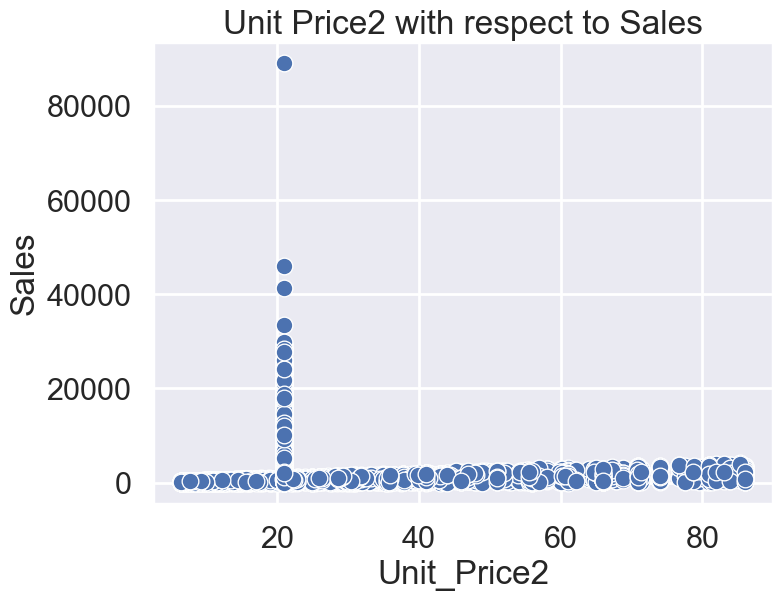

In [188]:
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plt.xlabel("Unit_Price2")
plt.ylabel("Sales")
plt.title("Unit Price2 with respect to Sales")
plot1=sns.scatterplot(x=df['Unit_Price2'],y=df['Sales'],data=df)
plt.show()

In [189]:
Q1 = np.percentile(df['Unit_Price2'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df['Unit_Price2'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
print(Q3)
print(Q1)
print(IQR)
#print((df1['total_loss_pos'] < (Q1 - 1.5 * IQR)) | (df1['total_loss_pos'] > (Q3 + 1.5 * IQR)))
outliers=[]
for i in df['Unit_Price2'] : 
        if (i<(Q1 - 1.5 * IQR) or i>(Q3 + 1.5 * IQR)):
            outliers.append(i)
print(len(outliers))

20.99
19.98
1.009999999999998
3938


In [190]:
df[['Unit Price','Unit_Price1','Unit_Price2']].skew()

Unit Price    14.13
Unit_Price1    0.53
Unit_Price2    1.86
dtype: float64

In [191]:
#Log Transformation to handle right skewness
df['Unit_Price3'] = df['Unit Price'].apply(lambda x: np.log(x))

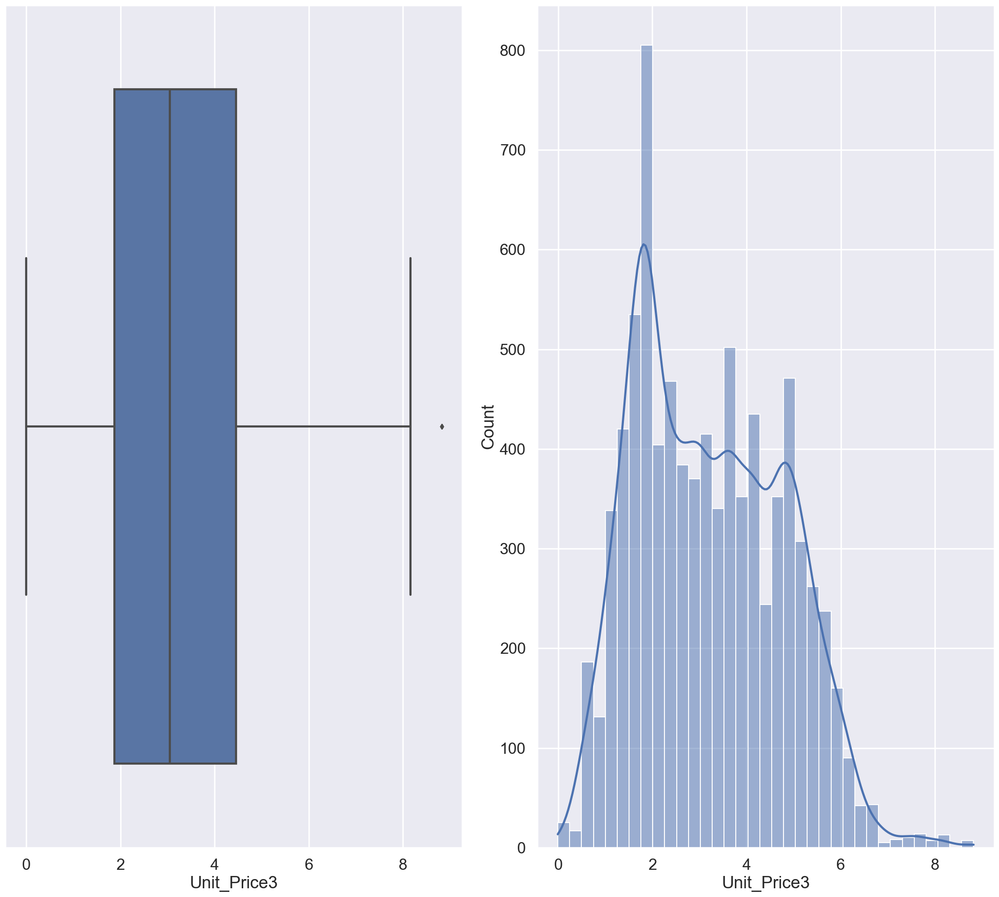

In [192]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,18))
plot = sns.boxplot(x=df['Unit_Price3'],data=df,ax=axs[0])
plot1=sns.histplot(data =df['Unit_Price3'], kde = True,ax=axs[1])
fig.tight_layout()

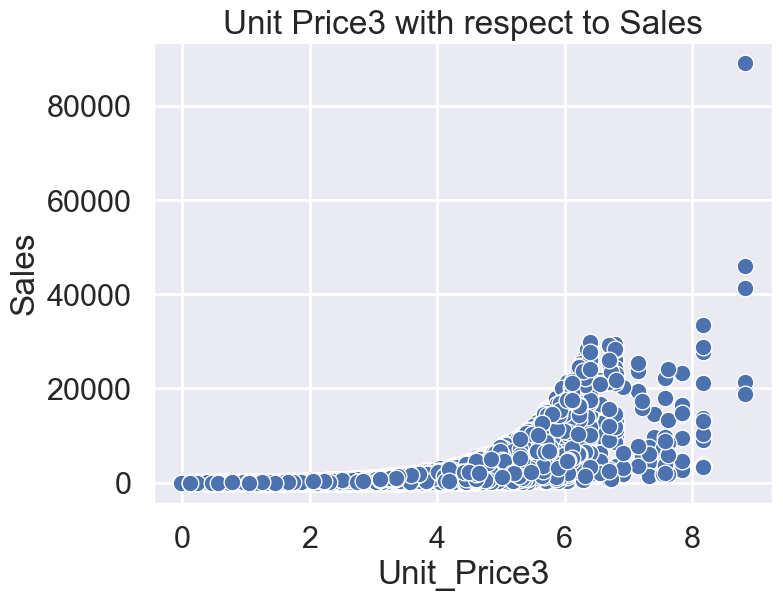

In [193]:
fig=plt.figure(figsize=(8,6))
ax=fig.add_subplot(111)
plt.xlabel("Unit_Price3")
plt.ylabel("Sales")
plt.title("Unit Price3 with respect to Sales")
plot1=sns.scatterplot(x=df['Unit_Price3'],y=df['Sales'],data=df)
plt.show()

In [194]:
df[['Unit Price','Unit_Price1','Unit_Price2','Unit_Price3']].skew()

Unit Price    14.13
Unit_Price1    0.53
Unit_Price2    1.86
Unit_Price3    0.34
dtype: float64

In [195]:
df[['Unit Price','Unit_Price1','Unit_Price2','Unit_Price3']].describe()

,Unit Price,Unit_Price1,Unit_Price2,Unit_Price3
count,8399.00,8399.00,8399.00,8399.00
mean,89.35,37.69,24.78,3.22
std,290.35,33.05,15.96,1.55
min,0.99,6.48,6.48,-0.01
25%,6.48,6.48,19.98,1.87
50%,20.99,20.99,20.99,3.04
75%,85.99,85.99,20.99,4.45
max,6783.02,85.99,85.99,8.82


In [196]:
df['Unit_Price4'] = df['Unit Price'].apply(lambda x: np.sqrt(x))

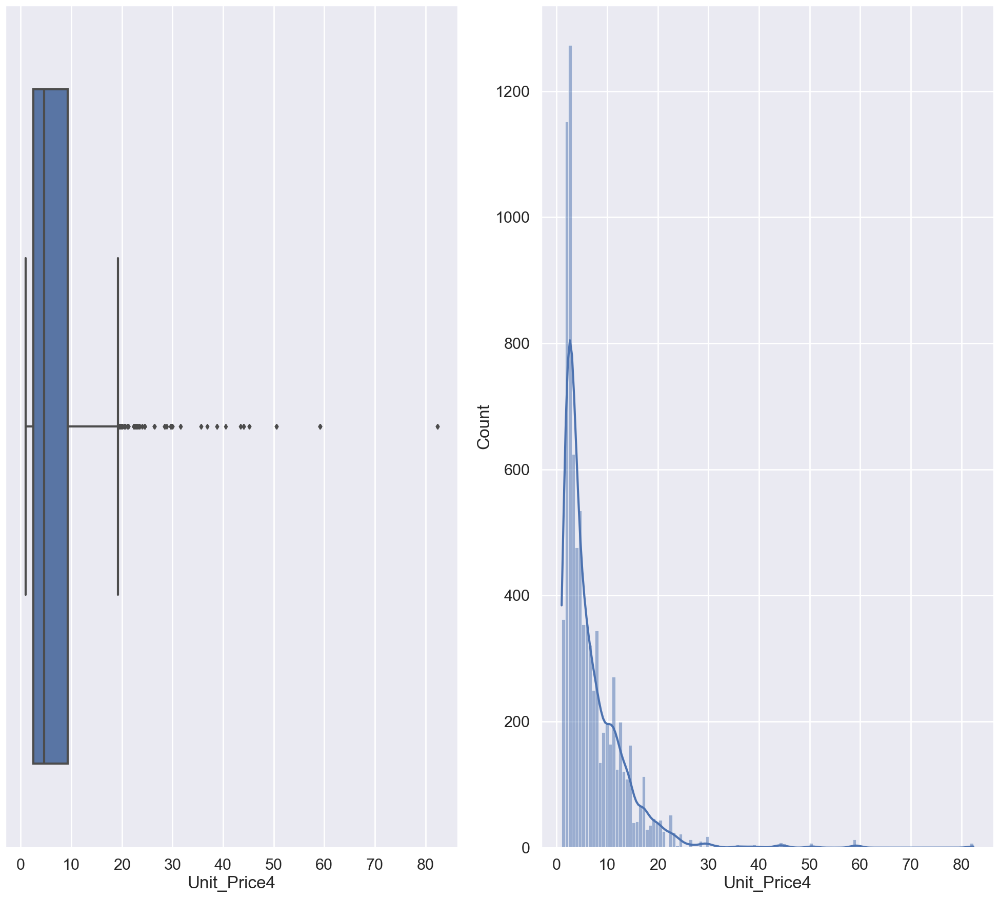

In [197]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,18))
plot = sns.boxplot(x=df['Unit_Price4'],data=df,ax=axs[0])
plot1=sns.histplot(data =df['Unit_Price4'], kde = True,ax=axs[1])
fig.tight_layout()

In [198]:
df[['Unit Price','Unit_Price1','Unit_Price2','Unit_Price3','Unit_Price4']].skew()
# We can see square transform doesnt work well on right skewed data.
#Log transform works well on right skewed data where as square transform works well on left skewed data

Unit Price    14.13
Unit_Price1    0.53
Unit_Price2    1.86
Unit_Price3    0.34
Unit_Price4    3.61
dtype: float64

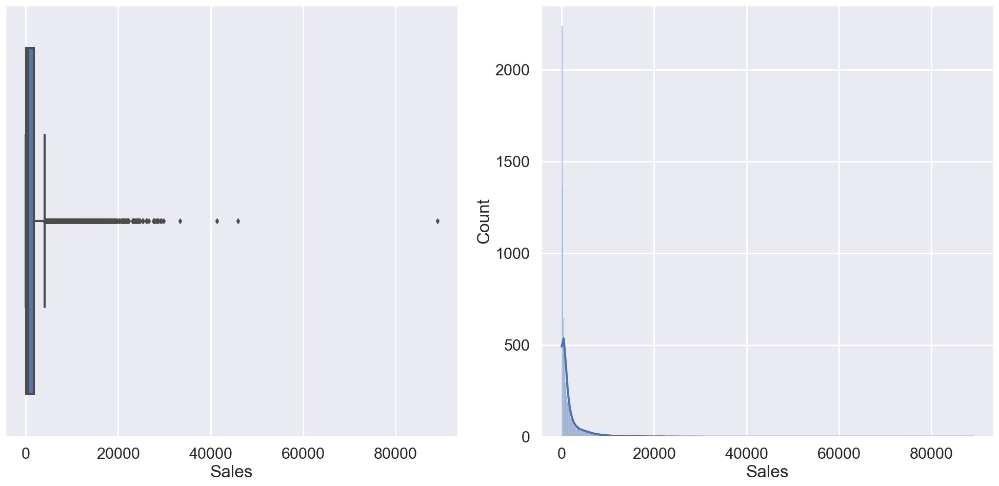

In [199]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Sales'],data=df,ax=axs[0])
plot1=sns.histplot(data =df['Sales'], kde = True,ax=axs[1])
fig.tight_layout()

In [200]:
#As its right skewed lets try using log transform
df['Sales3']=df['Sales'].apply(lambda x: np.log(x))

In [201]:
df[['Sales','Sales3']].skew()

Sales    5.39
Sales3   0.05
dtype: float64

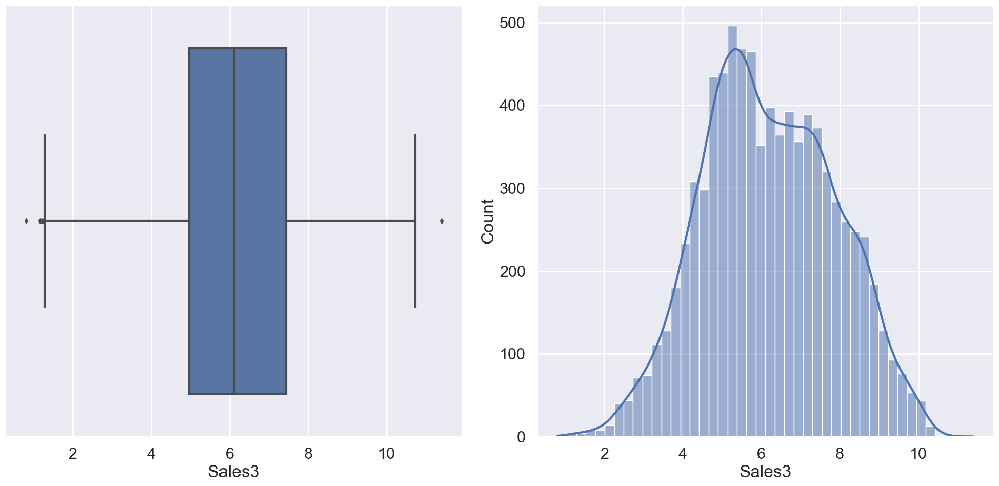

In [202]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Sales3'],data=df,ax=axs[0])
plot1=sns.histplot(data =df['Sales3'], kde = True,ax=axs[1])
fig.tight_layout()

In [203]:
df['Profit'].describe()

count     8399.00
mean       181.18
std       1196.65
min     -14140.70
25%        -83.31
50%         -1.50
75%        162.75
max      27220.69
Name: Profit, dtype: float64

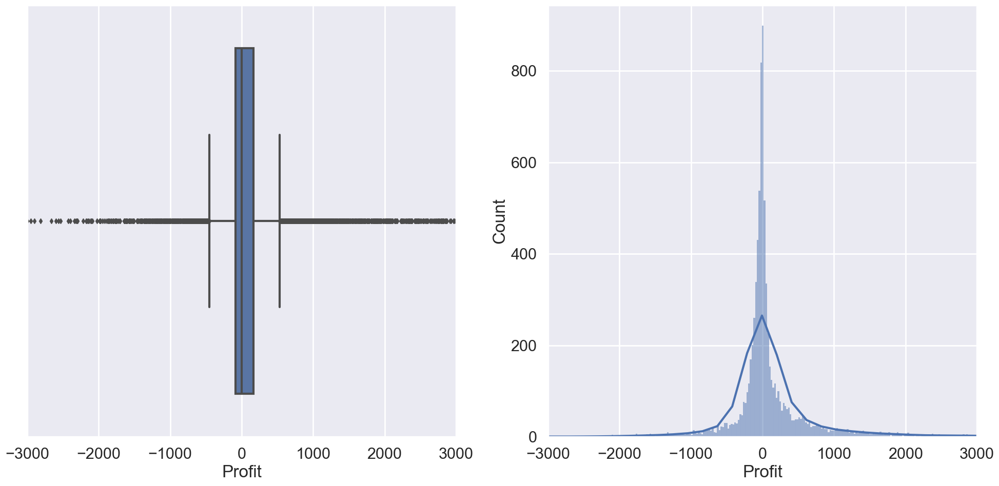

In [204]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Profit'],data=df,ax=axs[0])
plot.set_xlim(-3000,3000)
plot1=sns.histplot(data =df['Profit'], kde = True,ax=axs[1])
plot1.set_xlim(-3000,3000)
fig.tight_layout()

In [205]:
df['Profit'].skew()

3.647238764813306

In [206]:
outliers = []
threshold = 1
mean = np.mean(df['Profit'])
std = df['Profit'].std()
for i in df['Profit']:
    z_score = (i-mean)/std
    if (np.abs(z_score) > threshold):
        outliers.append(i)
print(len(outliers))
print(outliers)

691
[-1766.01, 3424.22, -1759.58, 1902.24, 2825.15, 3387.35, 2332.395, 2176.19, 5322.14, -1274.02, -1059.2, 3122.78, -1414.41, 1881.5759999999998, -2816.3379, 1465.866, 10951.306499999999, 7416.43, -11053.6, 1459.791, 1951.3, 1418.36, -3755.0331, 2509.52, 2699.67, 8793.539, 6907.613, 5353.19, 2808.219, 8417.567000000001, -1975.26, 2113.95, -1775.83, -2088.68, 2795.36, 2155.41, 2969.81, 5386.32, 1864.6560000000002, 1765.48, 4938.78, 1443.3509999999999, 2763.1259999999997, -1129.96, 5626.42, 1411.029, -5572.3935, 2608.72, 2109.21, 2665.396, 1467.82, 3030.16, -1396.22, -1163.21, -1086.43, 2437.17, 3506.24, -1048.248, 2342.214, -3061.82, -1430.451, 3049.4515, 1581.93, 2549.4030000000002, -1207.18, -1195.29, 1380.3210000000001, 3277.57, 2093.7, 2369.844, 3051.62, -1640.511, 1660.15, -1115.99, 1680.786, 1733.4730000000002, 1512.07, -4437.91, 1408.1865, -1069.72, 3724.5725, -1642.65, 2848.17, 1724.6755, -1448.83, -1760.5710000000001, 4604.79, 2014.82, -1197.58, 2820.44, 1912.92, 1462.724, 286

In [207]:
m=df['Profit'].mean()
s=df['Profit'].std()
u=m+1*s
l=m-1*s
print(u,l)
def zscore_map(i,u,l):
    if i in outliers:
        if i>u:
            i=u
            return i
        elif(i<l):
            i=l
            return i
        else:
            return i
    else:
        return i
            
df['Profit1']=df['Profit'].apply(lambda x: zscore_map(x,u,l))

1377.8377483965628 -1015.4689045863482


In [208]:
df[['Profit','Profit1']].skew()

Profit    3.65
Profit1   0.96
dtype: float64

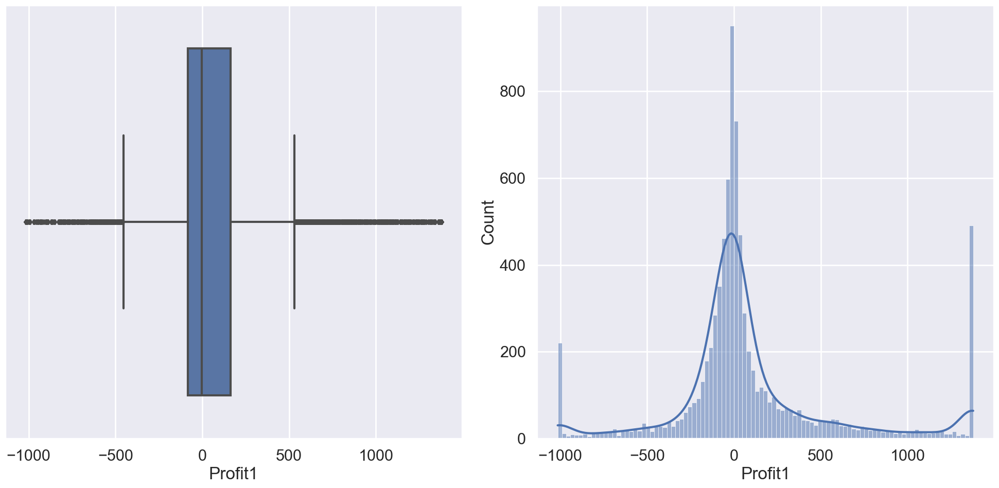

In [209]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Profit1'],data=df,ax=axs[0])
#plot.set_xlim(-3000,3000)
plot1=sns.histplot(data =df['Profit1'], kde = True,ax=axs[1])
#plot1.set_xlim(-3000,3000)
fig.tight_layout()

In [210]:
df['Profit2']=df['Profit'].apply(lambda x: np.log(x) if x>0 else (np.log(abs(x)))*-1)

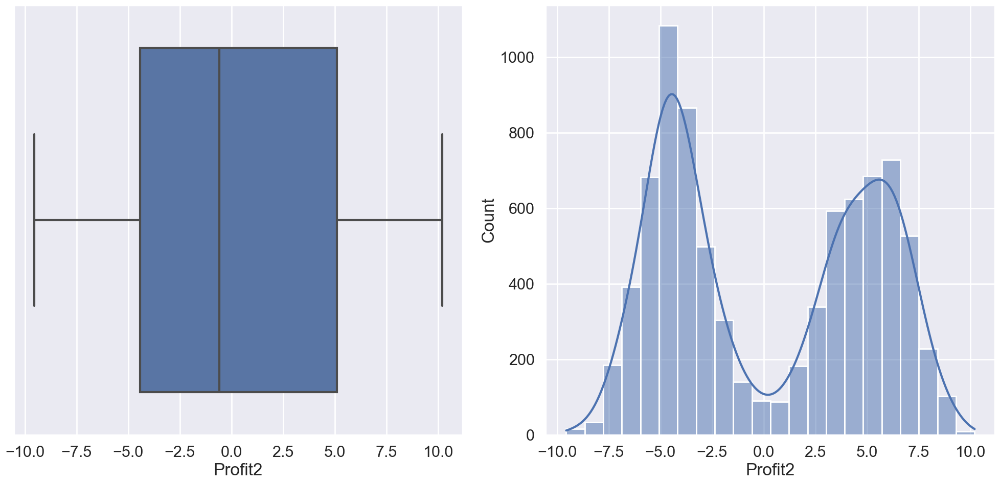

In [211]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Profit2'],data=df,ax=axs[0])
#plot.set_xlim(-3000,3000)
plot1=sns.histplot(data =df['Profit2'], kde = True,ax=axs[1])
#plot1.set_xlim(-3000,3000)
fig.tight_layout()

In [212]:
df[['Profit','Profit1','Profit2']].skew()

Profit    3.65
Profit1   0.96
Profit2   0.08
dtype: float64

In [213]:
df['Profit3'] = df['Profit'].apply(lambda x: np.sqrt(x)if x>0 else (np.sqrt(abs(x)))*-1)

In [214]:
df[['Profit','Profit1','Profit2','Profit3']].skew()

Profit    3.65
Profit1   0.96
Profit2   0.08
Profit3   0.82
dtype: float64

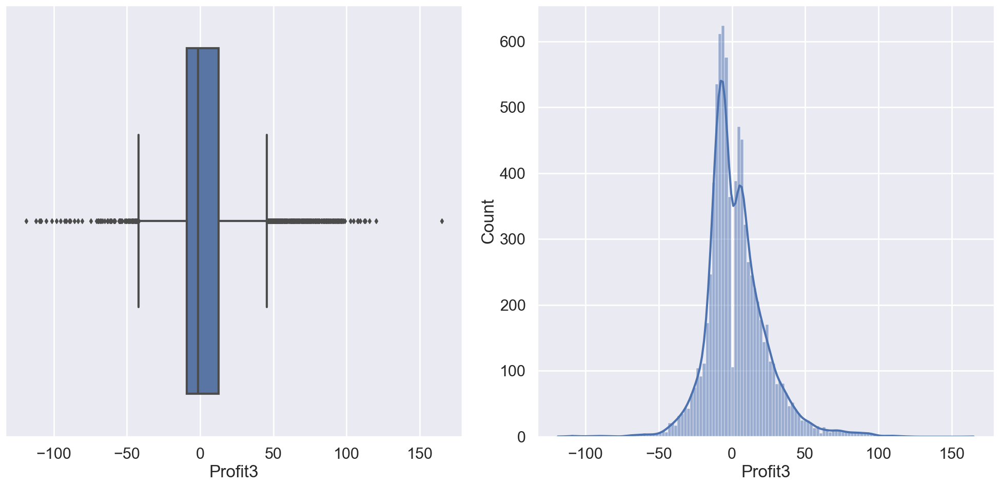

In [215]:
fig,axs=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
plot = sns.boxplot(x=df['Profit3'],data=df,ax=axs[0])
#plot.set_xlim(-3000,3000)
plot1=sns.histplot(data =df['Profit3'], kde = True,ax=axs[1])
#plot1.set_xlim(-3000,3000)
fig.tight_layout()

In [216]:
df.kurt()

C:\Users\supri\AppData\Local\Temp\ipykernel_14288\1257127604.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.kurt()


Row ID                 -1.20
Order ID               -1.18
Order Quantity         -1.21
Sales                  60.93
Discount               -0.96
Profit                 67.35
Unit Price            271.17
Shipping Cost           7.75
Product Base Margin    -0.64
Order Month            -1.20
Order Year             -1.37
Order Day              -1.19
Unit_Price1            -1.46
Unit_Price2             3.30
Unit_Price3            -0.64
Unit_Price4            25.48
Sales3                 -0.52
Profit1                 1.93
Profit2                -1.56
Profit3                 4.16
dtype: float64

In [217]:
df['Profit'].corr(df['Sales'])

0.5819602731443055

In [218]:
df['Profit2'].corr(df['Sales3'])

0.3645019211827654

In [219]:
df['Unit Price'].corr(df['Sales'])

0.6025212857685714

In [220]:
df['Unit_Price3'].corr(df['Sales3'])

0.8671499175722742

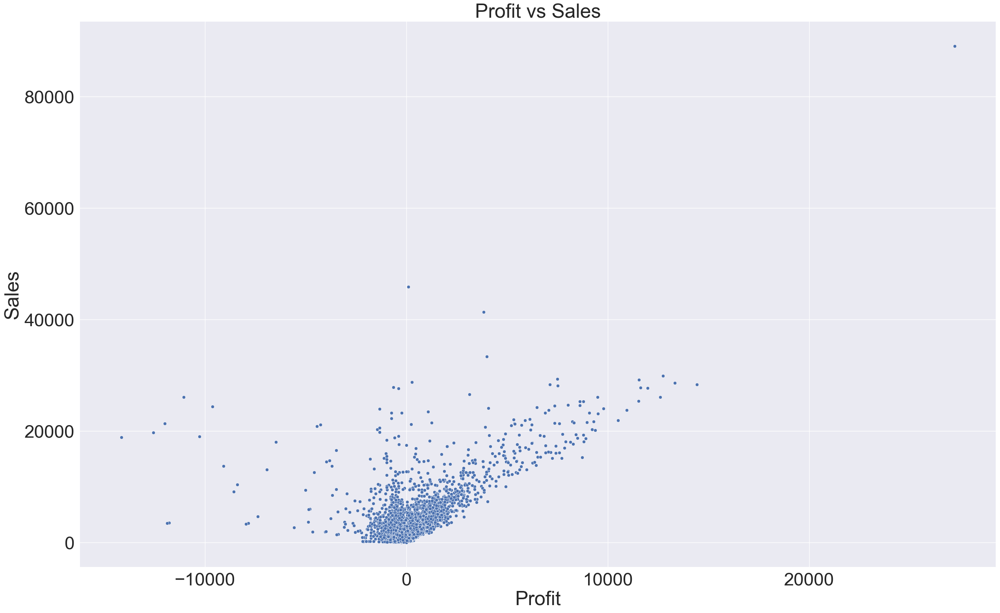

In [251]:
fig=plt.figure(figsize=(30,18))
ax=fig.add_subplot(111)
plt.title('Profit vs Sales')
plot=sns.scatterplot(x=df['Profit'],y=df['Sales'],data=df)
plt.show()

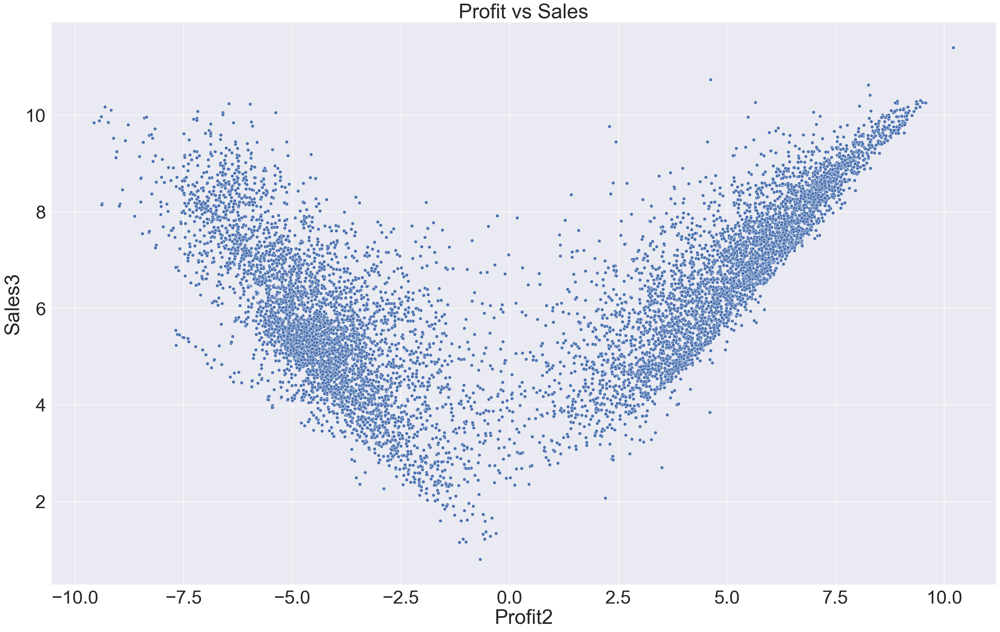

In [252]:
fig=plt.figure(figsize=(30,18))
ax=fig.add_subplot(111)
plt.title('Profit vs Sales')
plot=sns.scatterplot(x=df['Profit2'],y=df['Sales3'],data=df)
plt.show()

In [223]:
pd.options.display.float_format = '{:.2f}'.format
df[['Customer Segment','Order Quantity','Sales','Sales3','Discount','Profit','Profit2']].groupby(by='Customer Segment').sum().sort_values("Discount",ascending=False)

,Order Quantity,Sales,Sales3,Discount,Profit,Profit2
Customer Segment,,,,,,
Corporate,78517,5498904.88,19005.35,153.31,599745.92,704.33
Home Office,52807,3564763.88,12671.52,100.47,318354.10,553.93
Consumer,41760,3063611.08,10262.79,82.29,287959.98,490.67
Small Business,41693,2788320.99,10118.71,81.12,315707.96,517.07


In [224]:
df1=pd.DataFrame(df.groupby('Customer Segment')['Profit2','Sales3','Discount'].agg(['sum']))
#df1['CustomerSegment']=['Consumer','Corporate','Home Office','Small Business']
df1 = df1.reset_index()
df1.columns = df1.columns.get_level_values(0)
df1

C:\Users\supri\AppData\Local\Temp\ipykernel_14288\1530326955.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df1=pd.DataFrame(df.groupby('Customer Segment')['Profit2','Sales3','Discount'].agg(['sum']))


,Customer Segment,Profit2,Sales3,Discount
0,Consumer,490.67,10262.79,82.29
1,Corporate,704.33,19005.35,153.31
2,Home Office,553.93,12671.52,100.47
3,Small Business,517.07,10118.71,81.12


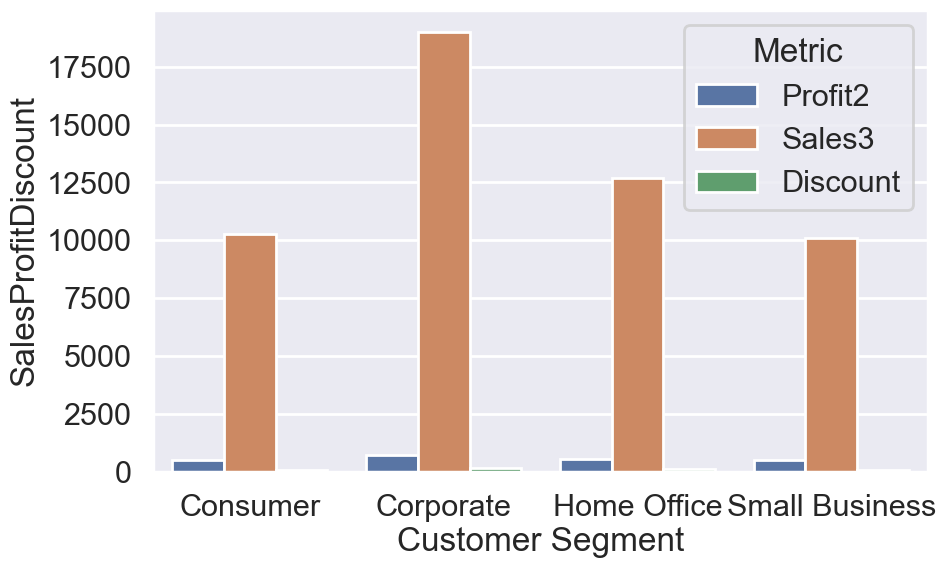

In [225]:
fig=plt.figure(figsize=(10,6))
ax=fig.add_subplot(111)
df1_melt = df1.melt(id_vars=['Customer Segment'], var_name='Metric', value_name='SalesProfitDiscount')
plot=sns.barplot(x='Customer Segment', y='SalesProfitDiscount', hue='Metric', data=df1_melt)
sns.set(style="whitegrid")
plt.show()

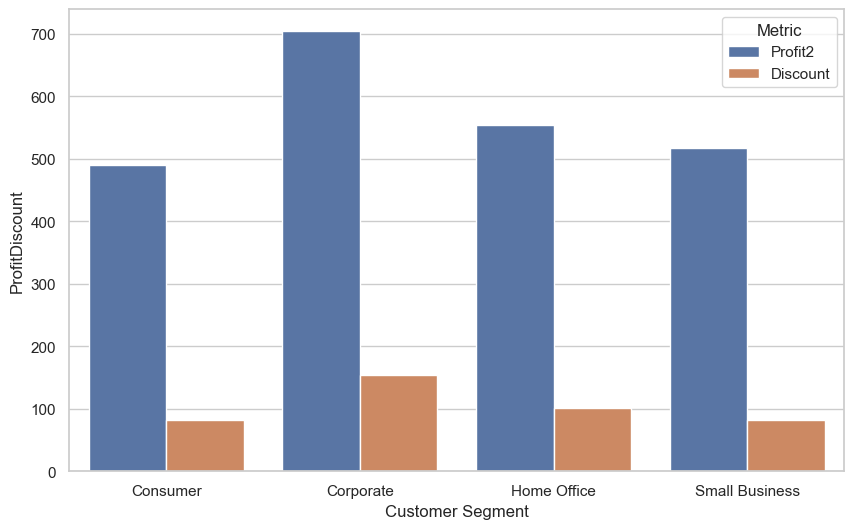

In [226]:
fig=plt.figure(figsize=(10,6))
ax=fig.add_subplot(111)
df2_melt = df1.melt(id_vars=['Customer Segment'],value_vars=['Profit2','Discount'], var_name='Metric', value_name='ProfitDiscount')
plot=sns.barplot(x='Customer Segment', y='ProfitDiscount', hue='Metric', data=df2_melt)
sns.set(style="whitegrid")
plt.show()

In [227]:
df.groupby(by='Product Category').sum().sort_values("Profit",ascending=False)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Product Category,,,,,,,,,,,,,,,,,,,,
Technology,8527201,60845001,52175,5984248.18,100.66,886313.52,374609.00,18491.84,1148.77,13536,4151628,32272,118519.67,65050.86,8633.51,20990.47,14587.70,534491.00,2877.41,18118.52
Office Supplies,19468739,138890645,118278,3752762.10,231.56,518021.46,166268.39,36095.51,2127.53,29905,9268370,71742,100340.08,100286.79,11396.55,20315.49,25313.72,264205.95,-14.27,7473.64
Furniture,7279860,51941899,44324,5178590.54,84.97,117432.99,209541.84,53243.69,1028.30,11337,3466045,26402,97724.13,42828.86,7012.63,16317.73,12156.95,27987.51,-597.14,-381.76


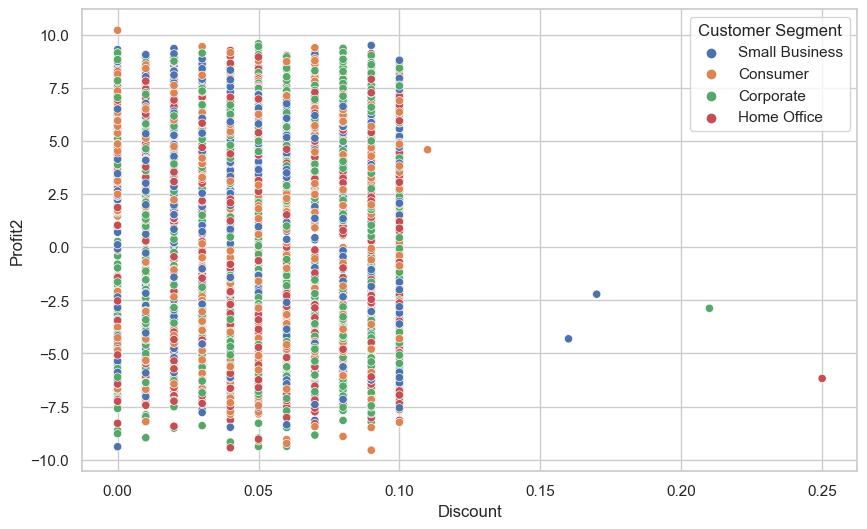

In [228]:
fig=plt.figure(figsize=(10,6))
ax=fig.add_subplot(111)
plot=sns.scatterplot(x='Discount', y='Profit2', hue='Customer Segment', data=df)
plt.show()

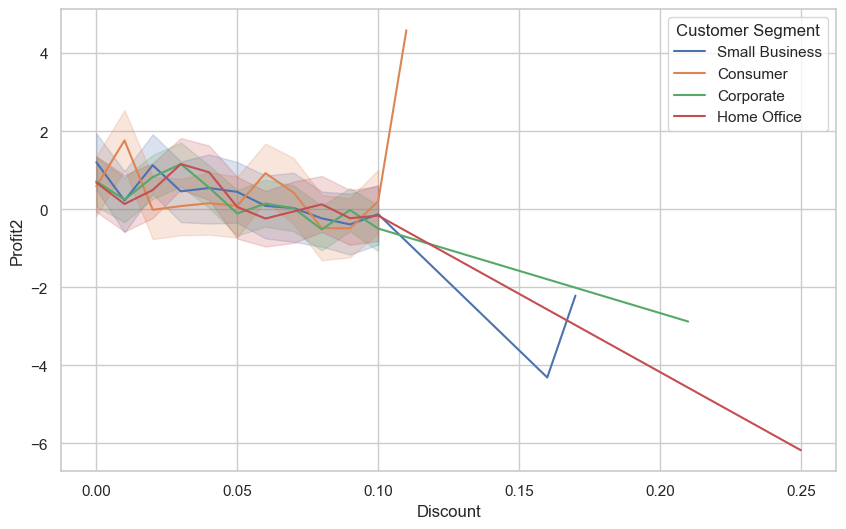

In [229]:
fig=plt.figure(figsize=(10,6))
ax=fig.add_subplot(111)
plot=sns.lineplot(x='Discount', y='Profit2', hue='Customer Segment', data=df)
plt.show()

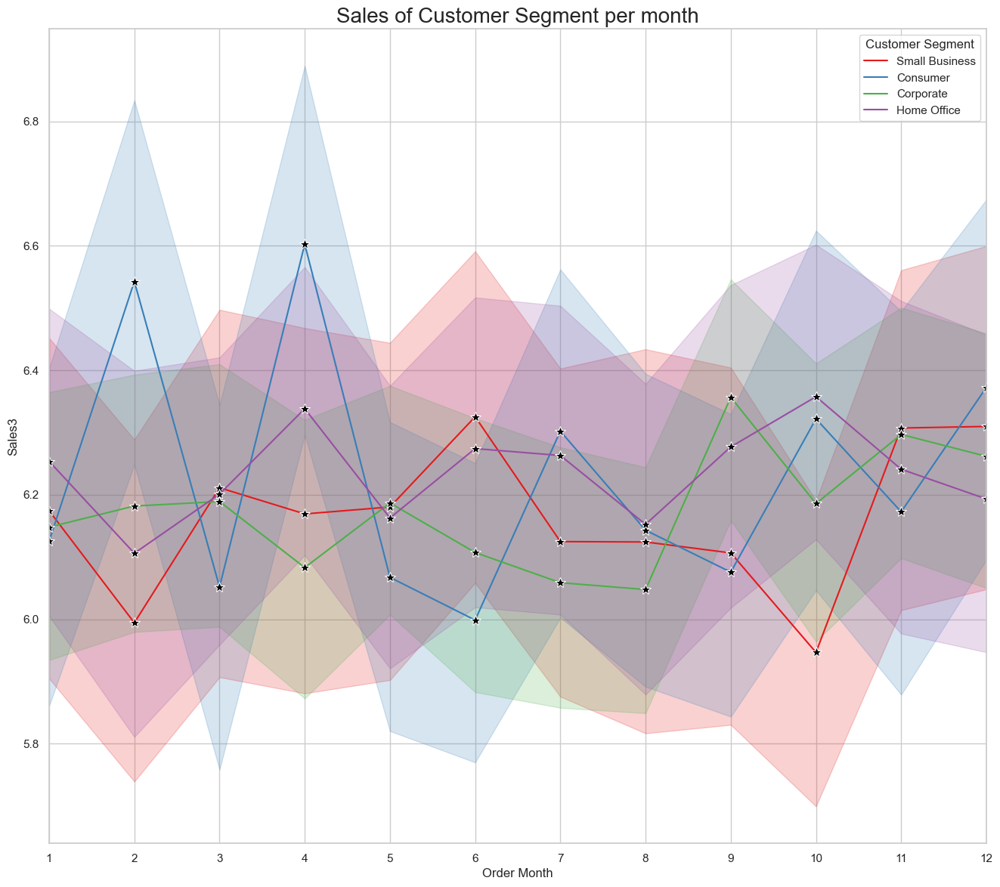

In [230]:
fig=plt.figure(figsize=(16,14))
ax=fig.add_subplot(111)
plt.title("Sales of Customer Segment per month",fontsize=20)
plot=sns.lineplot(x='Order Month', y='Sales3', hue='Customer Segment',palette='Set1', data=df,marker='*',markerfacecolor='black',markersize=10)
plot.set_xlim([1,12])
plot.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.show()

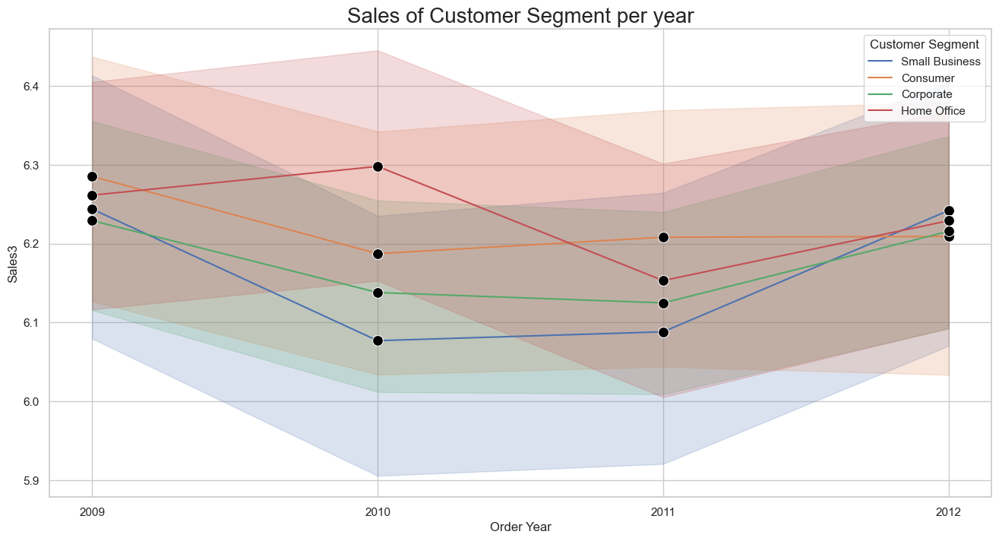

In [231]:
fig=plt.figure(figsize=(16,8))
ax=fig.add_subplot(111)
plt.title("Sales of Customer Segment per year",fontsize=20)
plot=sns.lineplot(x='Order Year', y='Sales3', hue='Customer Segment', data=df,marker='o',markerfacecolor='black',markersize=10)
#plot.set_xlim([1,12])
plot.set_xticks([2009,2010,2012,2011])
plt.show()

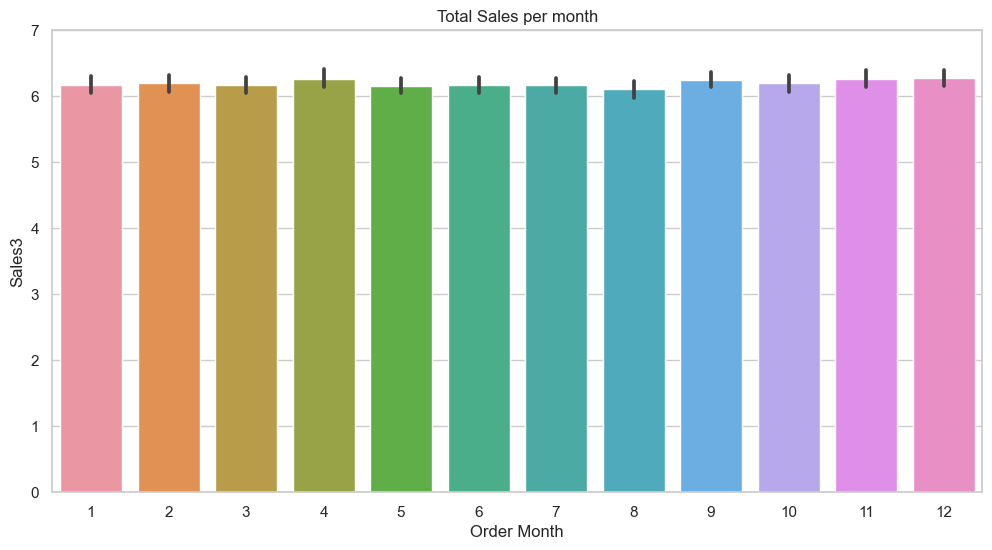

In [232]:
df_grp_by_mnth=df.groupby('Order Month').sum().reset_index()
fig=plt.figure(figsize=(12,6))
plt.title('Total Sales per month')
plot=sns.barplot(x='Order Month',y='Sales3',data=df)
plot.set_ylim([0,7])
plot.set_yticks([0,1,2,3,4,5,6,7])
plt.show()

In [233]:
l=[]
for i in range(1,13):
    df2=df[df['Order Month']==i]
    j=df2.groupby('Customer Segment').sum()[['Sales3']].sort_values('Sales3',ascending=False)
    j.reset_index(inplace=True)
    l.append((j['Customer Segment'][0],j['Sales3'][0]))
print(l)

[('Corporate', 1530.8141799137866), ('Corporate', 1483.639757413116), ('Corporate', 1714.3513719945706), ('Corporate', 1411.242883592925), ('Corporate', 1757.0126055508863), ('Corporate', 1337.4654769016083), ('Corporate', 1557.0630586368884), ('Corporate', 1584.4797598539124), ('Corporate', 1862.4731317904368), ('Corporate', 1571.1824823977097), ('Corporate', 1511.2367555185167), ('Corporate', 1684.3875490624202)]


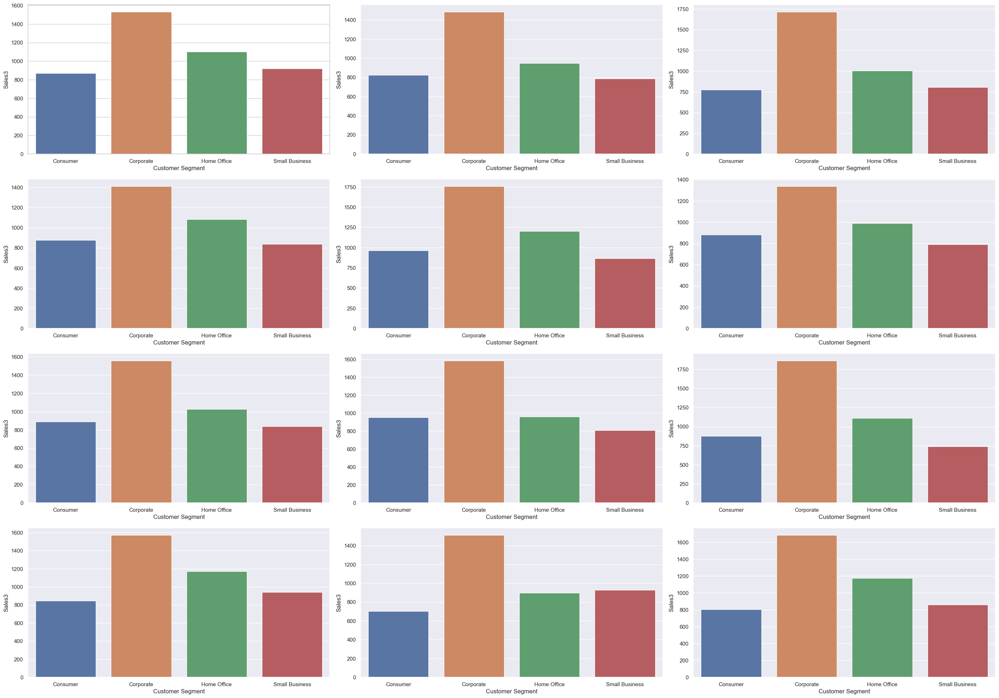

In [234]:
fig=plt.figure(figsize=(28,24))
for i in range(1,13):
    df2=df[df['Order Month']==i]
    j=df2.groupby('Customer Segment').sum()[['Sales3']].reset_index()
    ax=plt.subplot(5,3,i)
    sns.set(font_scale=1)
    plot=sns.barplot(x=j['Customer Segment'],y=j['Sales3'],data=j,ax=ax)
plt.tight_layout()    

In [235]:
l=[]
for i in [2009,2010,2011,2012]:
    df2=df[df['Order Year']==i]
    j=df2.groupby('Customer Segment').sum()[['Sales3']].sort_values('Sales3',ascending=False)
    j.reset_index(inplace=True)
    l.append((j['Customer Segment'][0],j['Sales3'][0]))
print(l)

[('Corporate', 4914.882927754112), ('Corporate', 4677.183689556565), ('Corporate', 4422.147254375197), ('Corporate', 4991.1351409409035)]


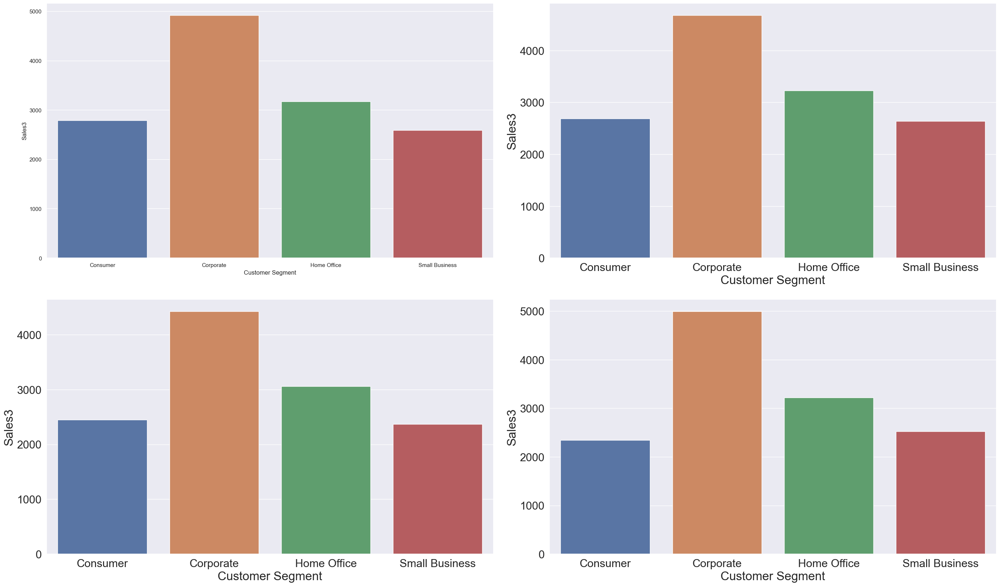

In [236]:
l=[2009,2010,2011,2012]
fig=plt.figure(figsize=(28,24))
for i in range(len(l)):
    df2=df[df['Order Year']==l[i]]
    j=df2.groupby('Customer Segment').sum()[['Sales3']].reset_index()
    ax=plt.subplot(3,2,i+1)
    sns.set(font_scale=2)
    plot=sns.barplot(x=j['Customer Segment'],y=j['Sales3'],data=j,ax=ax)
plt.tight_layout()  

In [237]:
df.groupby(by='Product Category').sum().sort_values("Profit",ascending=False)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Product Category,,,,,,,,,,,,,,,,,,,,
Technology,8527201,60845001,52175,5984248.18,100.66,886313.52,374609.00,18491.84,1148.77,13536,4151628,32272,118519.67,65050.86,8633.51,20990.47,14587.70,534491.00,2877.41,18118.52
Office Supplies,19468739,138890645,118278,3752762.10,231.56,518021.46,166268.39,36095.51,2127.53,29905,9268370,71742,100340.08,100286.79,11396.55,20315.49,25313.72,264205.95,-14.27,7473.64
Furniture,7279860,51941899,44324,5178590.54,84.97,117432.99,209541.84,53243.69,1028.30,11337,3466045,26402,97724.13,42828.86,7012.63,16317.73,12156.95,27987.51,-597.14,-381.76


In [249]:
df.groupby(by='Customer Name').sum().sort_values("Sales",ascending=False).head(5)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Customer Name,,,,,,,,,,,,,,,,,,,,
Emily Phan,39327,280171,269,117124.44,0.58,34005.45,7635.48,170.16,5.17,58,20098,156,458.48,198.48,41.89,153.54,73.27,3818.77,12.21,249.19
Deborah Brumfield,101793,726226,554,97433.14,0.85,31121.22,2796.16,329.59,10.96,100,40210,281,1153.97,482.50,82.14,199.26,144.63,8852.79,64.86,426.80
Roy Skaria,101441,723484,773,92542.15,1.21,1343.93,3591.05,466.94,13.51,199,52280,329,1171.71,644.75,94.03,229.85,173.44,116.91,-10.71,-17.77
Sylvia Foulston,101832,726347,707,88875.76,1.74,5141.90,4451.96,606.09,13.38,167,48242,378,1318.09,610.64,95.18,247.98,168.79,1429.62,-17.82,17.97
Grant Carroll,117490,838915,739,88417.00,1.18,27977.28,3276.99,288.24,13.68,223,54292,406,1148.67,592.69,97.50,223.18,178.62,8454.19,17.57,332.16


In [250]:
df.groupby(by='Customer Name').sum().sort_values("Profit",ascending=False).head(5)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Customer Name,,,,,,,,,,,,,,,,,,,,
Emily Phan,39327,280171,269,117124.44,0.58,34005.45,7635.48,170.16,5.17,58,20098,156,458.48,198.48,41.89,153.54,73.27,3818.77,12.21,249.19
Deborah Brumfield,101793,726226,554,97433.14,0.85,31121.22,2796.16,329.59,10.96,100,40210,281,1153.97,482.50,82.14,199.26,144.63,8852.79,64.86,426.80
Grant Carroll,117490,838915,739,88417.00,1.18,27977.28,3276.99,288.24,13.68,223,54292,406,1148.67,592.69,97.50,223.18,178.62,8454.19,17.57,332.16
Karen Carlisle,63375,452394,339,59313.32,0.86,21731.52,1703.25,148.47,6.71,89,30160,209,554.90,338.43,53.01,120.67,95.40,4287.28,20.21,233.48
Alejandro Grove,73901,526453,415,83561.93,0.69,20588.92,3065.62,294.70,7.15,84,28143,232,683.11,257.13,56.47,161.70,101.88,4136.29,29.11,244.09


In [240]:
df.groupby(by='Region').sum().sort_values("Sales",ascending=False)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Region,,,,,,,,,,,,,,,,,,,,
West,8954074,63847433,51423,3597549.28,97.19,297008.58,202225.91,24583.15,1011.41,13051,4002945,30366,74187.12,49504.47,6350.41,13794.59,12307.11,198398.49,447.49,5424.15
Ontario,7956122,56756201,46685,3063212.48,89.74,346868.58,138535.22,23475.26,944.57,11857,3671089,28137,68665.90,45257.06,5852.82,12172.56,11295.25,193026.57,650.55,6078.97
Prarie,7529275,53727326,43732,2837304.60,85.19,321160.18,141655.71,20870.93,868.55,10862,3429844,26587,62137.10,41750.70,5440.95,11381.09,10547.98,173007.44,606.22,5517.17
Atlantic,4400425,31407342,28068,2014248.20,54.77,238960.61,95839.72,14460.83,551.76,7184,2171281,17215,42067.33,27429.24,3525.98,7512.21,6749.66,107665.39,415.28,3784.23
Quebec,3231114,23043348,19589,1510195.08,38.90,140426.59,72348.31,10543.34,402.26,5159,1570217,12330,29513.27,19212.72,2509.82,5436.65,4823.18,55516.91,-69.13,1554.59
Yukon,1445832,10350273,13596,975867.37,27.54,73849.25,54195.71,7469.81,281.33,3562,1089688,8527,21310.42,13280.15,1777.12,3879.47,3371.96,48249.88,82.90,1278.45
Northwest Territories,1717026,12248789,9722,800847.33,19.73,100653.05,39597.30,5418.93,204.40,2560,792132,6023,15950.64,9794.87,1341.60,2945.91,2481.81,49054.78,138.15,1554.12
Nunavut,41932,296833,1962,116376.48,4.13,2841.12,6021.35,1008.79,40.33,543,158847,1231,2752.10,1937.30,243.98,501.23,481.41,1764.98,-5.48,18.72


In [241]:
start_date = '2012-12-01'
end_date = '2012-12-30'

result = (df['Order Date'] > start_date) & (df['Order Date'] <= end_date)
# Selecting rows from DataFrame
df3 = df.loc[result]
df3.groupby("Province").sum().sort_values('Sales',ascending=False)

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Province,,,,,,,,,,,,,,,,,,,,
Ontario,159951,1142309,708,77066.89,1.44,8214.57,2832.98,440.33,14.51,348,58348,381,1154.56,786.62,96.14,213.53,180.84,404.88,-7.82,51.73
Quebec,66732,477166,368,63698.54,0.80,3116.95,2616.34,294.08,6.91,168,28168,198,741.96,330.49,55.48,149.92,96.92,2753.35,13.73,79.54
British Columbia,107026,763713,644,43234.77,0.98,1128.50,2740.33,334.98,11.74,276,46276,354,754.47,487.51,74.82,168.26,143.93,140.95,-19.34,-32.16
Saskachewan,64594,461201,352,40953.16,1.02,530.00,3845.67,273.68,10.20,216,36216,317,903.56,542.58,72.65,193.90,118.33,-675.41,-10.83,-29.41
Alberta,110017,786436,686,34753.98,1.23,4896.46,1722.98,294.48,11.94,288,48288,300,781.10,492.67,72.32,152.68,147.46,3220.94,4.73,81.19
Manitoba,57004,406738,240,16284.66,0.72,-693.67,847.44,204.94,5.92,144,24144,165,427.83,290.87,35.86,76.48,68.16,-693.67,-22.81,-55.36
Nova Scotia,38457,275211,339,15232.27,0.45,-36.49,432.30,174.78,5.45,120,20120,179,332.67,246.20,29.01,53.93,64.03,-36.49,-5.80,-6.82
Yukon,31562,225593,260,14481.56,0.68,1457.86,678.09,197.57,6.39,144,24144,177,464.34,327.38,36.07,72.51,67.70,1457.86,8.30,40.57
New Brunswick,27470,196245,120,6201.41,0.22,-365.85,198.44,47.88,2.28,48,8048,86,183.02,118.02,14.70,26.68,27.28,-365.85,-0.25,-6.25


In [242]:
result = (df['Region'] == 'Nunavut')
df4 = df.loc[result]
df4.groupby('Ship Mode').sum()

,Row ID,Order ID,Order Quantity,Sales,Discount,Profit,Unit Price,Shipping Cost,Product Base Margin,Order Month,Order Year,Order Day,Unit_Price1,Unit_Price2,Unit_Price3,Unit_Price4,Sales3,Profit1,Profit2,Profit3
Ship Mode,,,,,,,,,,,,,,,,,,,,
Delivery Truck,3853,27105,245,51789.22,0.50,1482.94,1879.00,395.70,4.71,72,16086,119,687.92,167.92,41.96,116.26,66.83,187.10,-0.46,9.68
Express Air,7064,50760,162,5472.74,0.58,-418.72,260.98,75.73,4.09,58,18099,166,216.22,180.24,23.64,40.46,48.88,-418.72,-5.15,-17.15
Regular Air,31015,218968,1555,59114.52,3.05,1776.90,3881.37,537.36,31.53,413,124662,946,1847.96,1589.14,178.38,344.51,365.71,1996.61,0.13,26.19


In [243]:
df5=df[['Order Quantity','Sales3','Discount','Profit2','Unit_Price3','Shipping Cost','Ship Mode','Order Month','Order Year','Order Day',]]

In [244]:
# To check which columns are highly correlated with Sales column 
df_corr1 = df5.corr()['Sales3'][2:]
df_corr2 = df5.corr()['Sales3'][:-9]
print(df_corr1)
print('\n')
print(df_corr2)
print('\n')
highly_corr_cols_wd_sales1 = df_corr1[abs(df_corr1) > 0.5].sort_values(ascending=False)
highly_corr_cols_wd_sales2 = df_corr2[abs(df_corr2) > 0.5].sort_values(ascending=False)
print(highly_corr_cols_wd_sales1)
print('\n')
print(highly_corr_cols_wd_sales2)

Discount        -0.02
Profit2          0.36
Unit_Price3      0.87
Shipping Cost    0.51
Order Month      0.01
Order Year      -0.01
Order Day        0.00
Name: Sales3, dtype: float64


Series([], Name: Sales3, dtype: float64)


Unit_Price3     0.87
Shipping Cost   0.51
Name: Sales3, dtype: float64


Series([], Name: Sales3, dtype: float64)


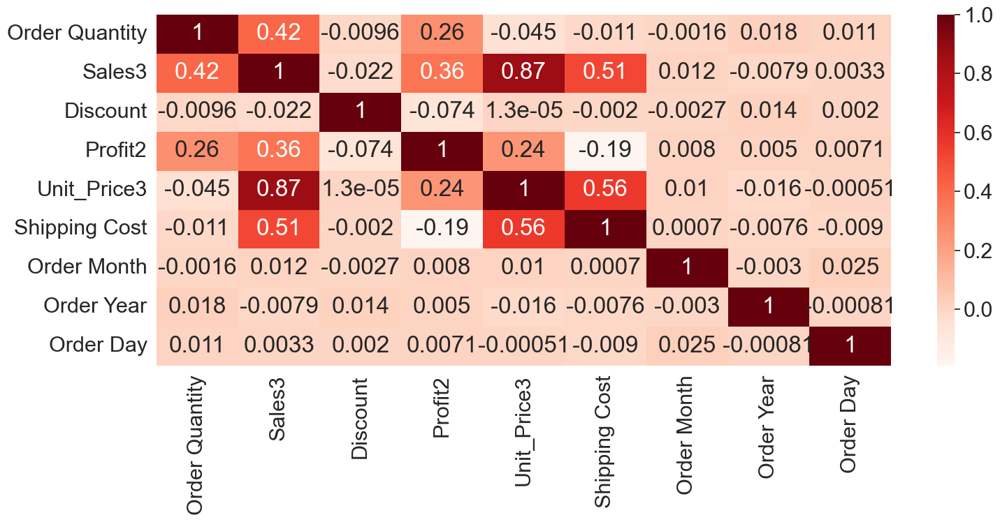

In [245]:
fig=plt.figure(figsize=(16,8))
ax=fig.add_subplot(111)
corr = df5.corr()
sns.heatmap(corr,annot=True,cmap='Reds')
fig.tight_layout()

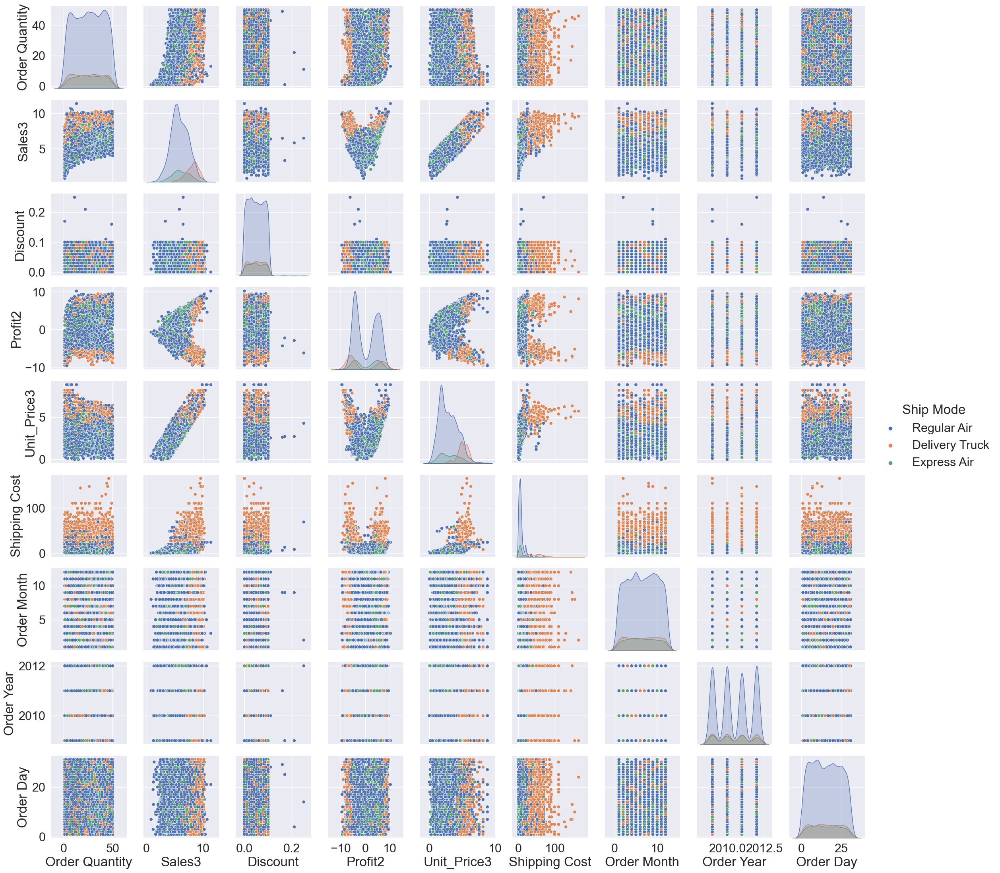

In [246]:
sns.pairplot(df5, hue = 'Ship Mode')

In [247]:
fig,axs=plt.subplots(nrows=4,ncols=2,figsize=(100,90))
sns.set(font_scale = 3)
plot1=sns.countplot(x=df['Ship Mode'],data=df,palette='rainbow',ax=axs[0][0])
plot1=sns.countplot(x=df['Region'],data=df,palette='rainbow',ax=axs[0][1])
plot1=sns.countplot(x=df['Order Priority'],data=df,palette='rainbow',ax=axs[1][0])
plot1=sns.countplot(x=df['Province'],data=df,palette='rainbow',ax=axs[1][1])
plot1=sns.countplot(x=df['Customer Segment'],data=df,palette='rainbow',ax=axs[2][0])
plot1=sns.countplot(x=df['Product Category'],data=df,palette='rainbow',ax=axs[2][1])
plot1=sns.countplot(x=df['Product Sub-Category'],data=df,palette='rainbow',ax=axs[3][0])
plot1=sns.countplot(x=df['Product Container'],data=df,palette='rainbow',ax=axs[3][1])
plot1.set_ylim([0,9000])
plot.set_yticks([0,1000,2000,3000,4000,5000,6000,7000,8000,9000])
#plot1.set_yticklabels(plot1.get_yticks(), size = 7)
fig.tight_layout()
#plt.xticks(fontsize=50)
#plt.yticks(fontsize=50)

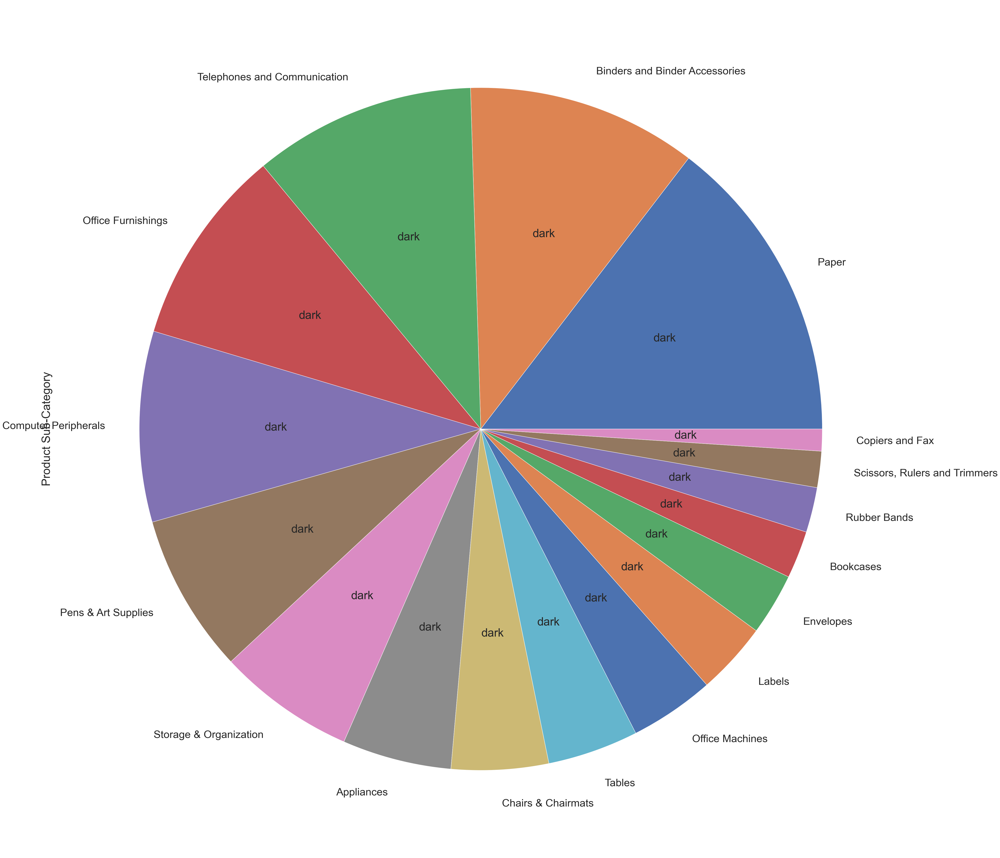

In [248]:
plt.figure(figsize=(50,48))
sns.set(font_scale =3)
df['Product Sub-Category'].value_counts().plot.pie(autopct='dark')
plt.show()